Notebook containing visualizations and exploratorive analysis of miReact outputa

# Loading dependencies

In [2]:
# Loading packages
knitr::opts_chunk$set(echo = TRUE)
library(tidyverse)
library(anndata)
library(ggExtra)
library(gridExtra)
library(ggrepel)
library(ggpubr)
library(Rtsne)
library(grid)
library(ggridges)

In [3]:
# Loading data 
# setwd("~/jsp_student_projects/miRNA_DGD_DE_F2024/data")
# ad <- read_h5ad("all_samples.h5ad")

setwd("~/jsp_student_projects/miRNA_DGD_DE_F2024/data")
ad <- read_h5ad("all_samples_pc1.h5ad")

setwd("~/jsp_student_projects/miRNA_DGD_DE_F2024/data")
df <- readRDS(file = "all_samples_df_pc1.Rda")

head(df)

,sample_id,miRNA,expression,cancer_type,sample_submitter_id,cancer_name,primary_site,sample_type,tissue_type,tumor_descriptor,⋯,vital_status,tissue_or_organ_of_origin,color,DGD_activity,GM_activity,max_prob_density_comp,comp_name_ours,comp_name,max_association_percent,max_prob_density
,<chr>,<chr>,<dbl>,<fct>,<chr>,<fct>,<fct>,<fct>,<fct>,<fct>,⋯,<fct>,<fct>,<fct>,<dbl>,<dbl>,<dbl>,<fct>,<fct>,<dbl>,<dbl>
1,TCGA-EW-A6SA-01A-21R-A32P-07,hsa-let-7a-5p,63867.18,BRCA,TCGA-EW-A6SA-01A,Breast Invasive Carcinoma,Breast,Primary Tumor,Tumor,Primary,⋯,Alive,"Breast, NOS",#ED1E91,-1.1463613,-0.82465086,28,Breast,Breast,100.00000,9.844606e-20
2,TCGA-E2-A14W-01A-11R-A12D-07,hsa-let-7a-5p,23471.88,BRCA,TCGA-E2-A14W-01A,Breast Invasive Carcinoma,Breast,Primary Tumor,Tumor,Primary,⋯,Alive,"Breast, NOS",#ED1E91,-1.4388003,-0.99281544,28,Breast,Breast,100.00000,1.050095e-09
3,TCGA-EW-A1PD-01A-11R-A144-07,hsa-let-7a-5p,23744.03,BRCA,TCGA-EW-A1PD-01A,Breast Invasive Carcinoma,Breast,Primary Tumor,Tumor,Primary,⋯,Alive,"Breast, NOS",#ED1E91,-1.1172353,-0.08194884,28,Breast,Breast,100.00000,6.007054e-15
4,TCGA-55-1594-01A-01R-0946-07,hsa-let-7a-5p,10814.66,LUAD,TCGA-55-1594-01A,Lung Adenocarcinoma,Lung,Primary Tumor,Tumor,Primary,⋯,Alive,"Lower lobe, lung",#D2C3DF,-2.2374550,-3.47406174,13,Lung,Cells,93.98350,2.944543e-20
5,TCGA-49-6742-11A-01R-1858-07,hsa-let-7a-5p,63666.80,LUAD,TCGA-49-6742-11A,Lung Adenocarcinoma,Lung,Solid Tissue Normal,Normal,Not Applicable,⋯,Dead,"Upper lobe, lung",#D2C3DF,0.5045059,1.64744323,43,Lung,Lung,99.99504,3.162420e-28
6,TCGA-50-5932-11A-01R-1755-07,hsa-let-7a-5p,81765.71,LUAD,TCGA-50-5932-11A,Lung Adenocarcinoma,Lung,Solid Tissue Normal,Normal,Not Applicable,⋯,Dead,"Upper lobe, lung",#D2C3DF,1.0884410,2.59366978,43,Lung,Lung,99.99994,3.068785e-13


In [4]:
setwd("~/jsp_student_projects/miRNA_DGD_DE_F2024/data")
component_anno <- readRDS(file = "annotation_with_component_info.rds")

head(component_anno)

,max_prob_density_comp,primary_site,comp_name_ours,sample_id,cancer_type,sample_submitter_id,cancer_name,sample_type,tissue_type,tumor_descriptor,age_at_index,gender,vital_status,tissue_or_organ_of_origin,color,comp_name,max_association_percent,max_prob_density
,<dbl>,<chr>,<fct>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<dbl>,<dbl>
1,0,Skin,Skin,TCGA-DA-A1I0-06A-11R-A20F-07,SKCM,TCGA-DA-A1I0-06A,Skin Cutaneous Melanoma,Metastatic,Tumor,Metastatic,63,male,Dead,"Skin, NOS",#BAD543,Lung,-Inf,3.033369e-35
2,0,Skin,Skin,TCGA-DA-A3F2-06A-11R-A20F-07,SKCM,TCGA-DA-A3F2-06A,Skin Cutaneous Melanoma,Metastatic,Tumor,Metastatic,55,male,Dead,"Skin, NOS",#BAD543,Lung,-Inf,2.788366e-29
3,0,Skin,Skin,TCGA-BF-A5ER-01A-12R-A27Q-07,SKCM,TCGA-BF-A5ER-01A,Skin Cutaneous Melanoma,Primary Tumor,Tumor,Primary,63,male,Alive,"Skin, NOS",#BAD543,Lung,-Inf,2.348375e-19
4,0,Skin,Skin,TCGA-QB-A6FS-06A-11R-A311-07,SKCM,TCGA-QB-A6FS-06A,Skin Cutaneous Melanoma,Metastatic,Tumor,Metastatic,49,male,Alive,"Skin, NOS",#BAD543,Lung,-Inf,1.136999e-09
5,0,Skin,Skin,TCGA-D3-A2JK-06A-11R-A18S-07,SKCM,TCGA-D3-A2JK-06A,Skin Cutaneous Melanoma,Metastatic,Tumor,Metastatic,24,male,Dead,"Skin, NOS",#BAD543,Lung,-Inf,2.703796e-09
6,0,Skin,Skin,TCGA-D3-A2J8-06A-11R-A18T-07,SKCM,TCGA-D3-A2J8-06A,Skin Cutaneous Melanoma,Metastatic,Tumor,Metastatic,48,male,Dead,"Skin, NOS",#BAD543,Lung,-Inf,1.144932e+04


In [5]:
head(ad$var)

,mature_iso_id,mirna_type,mature_iso_name_miRBase,mature_iso_validation_miRBase,seq,species,seed7,seed7target,tcgamatcher,tcga1match,⋯,cohort_pval_pearson,cohort_R_spearman,cohort_pval_spearman,DGD_R_pearson,DGD_pval_pearson,DGD_R_spearman,DGD_pval_spearman,mean_expression,cohort_mean_activity,DGD_mean_activity
,<chr>,<fct>,<chr>,<fct>,<fct>,<fct>,<fct>,<fct>,<fct>,<int>,⋯,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
hsa-let-7a-5p,MIMAT0000062,mature,hsa-let-7a-5p,experimental,TGAGGTAGTAGGTTGTATAGTT,Homo sapiens,GAGGTAG,CTACCTC,hsa-let-7a,0,⋯,1.517198e-57,0.19423888,2.921475e-91,0.060397299,4.232227e-10,0.10711124,1.292002e-28,34764.00290,0.13514323,-0.9704884
hsa-let-7a-2-3p,MIMAT0010195,mature,hsa-let-7a-2-3p,experimental,CTGTACAGCCTCCTAGCTTTCC,Homo sapiens,TGTACAG,CTGTACA,hsa-let-7a-2,2,⋯,2.005619e-01,-0.16861770,6.462790e-69,-0.037618959,1.011954e-04,-0.11718937,5.846085e-34,9.88273,-0.02611210,0.1814803
hsa-let-7b-5p,MIMAT0000063,mature,hsa-let-7b-5p,experimental,TGAGGTAGTAGGTTGTGTGGTT,Homo sapiens,GAGGTAG,CTACCTC,hsa-let-7b,4,⋯,1.776173e-14,0.11309973,9.866132e-32,0.060744503,3.360106e-10,0.22089379,4.026701e-118,18891.62420,0.13514323,-0.9704884
hsa-let-7b-3p,MIMAT0004482,mature,hsa-let-7b-3p,experimental,CTATACAACCTACTGCCTTCCC,Homo sapiens,TATACAA,TTGTATA,hsa-let-7b,4,⋯,1.052535e-13,-0.14292144,7.939074e-50,0.033056608,6.356255e-04,0.04367262,6.365358e-06,34.21169,0.10467485,-0.1548688
hsa-let-7c-5p,MIMAT0000064,mature,hsa-let-7c-5p,experimental,TGAGGTAGTAGGTTGTATGGTT,Homo sapiens,GAGGTAG,CTACCTC,hsa-let-7c,5,⋯,8.509842e-170,0.47626222,0.000000e+00,0.006781764,4.835420e-01,0.13859065,6.247343e-47,3676.21761,0.13514323,-0.9704884
hsa-let-7c-3p,MIMAT0026472,mature,hsa-let-7c-3p,experimental,CTGTACAACCTTCTAGCTTTCC,Homo sapiens,TGTACAA,TTGTACA,hsa-let-7c,5,⋯,1.454687e-04,-0.07722565,1.349987e-15,-0.028047407,3.754479e-03,-0.01309639,1.760503e-01,23.35317,0.08103602,0.1943780


## Correlation coefficient distribution

Plot showing the distributions of correlation coefficients (Pearson and Spearman) computed between observed expression vs activity inferred by miReact using either DGD or cohort mean as control. 

In [6]:
head(ad$var %>%
  pivot_longer(
    cols = c(cohort_R_pearson, cohort_R_spearman, DGD_R_pearson, DGD_R_spearman),
    names_to = "coefficient_type",
    values_to = "R_coefficient"
    ) %>%
  mutate(Method = if_else(str_detect(coefficient_type, "DGD"), "Generated Controls", "Global Median"), Correlation_type = if_else(str_detect(coefficient_type, "pearson"), "Pearson", "Spearman")))

mature_iso_id,mirna_type,mature_iso_name_miRBase,mature_iso_validation_miRBase,seq,species,seed7,seed7target,tcgamatcher,tcga1match,⋯,cohort_pval_spearman,DGD_pval_pearson,DGD_pval_spearman,mean_expression,cohort_mean_activity,DGD_mean_activity,coefficient_type,R_coefficient,Method,Correlation_type
<chr>,<fct>,<chr>,<fct>,<fct>,<fct>,<fct>,<fct>,<fct>,<int>,⋯,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<dbl>,<chr>,<chr>
MIMAT0000062,mature,hsa-let-7a-5p,experimental,TGAGGTAGTAGGTTGTATAGTT,Homo sapiens,GAGGTAG,CTACCTC,hsa-let-7a,0,⋯,2.921475e-91,4.232227e-10,1.292002e-28,34764.00290,0.1351432,-0.9704884,cohort_R_pearson,0.15385115,Global Median,Pearson
MIMAT0000062,mature,hsa-let-7a-5p,experimental,TGAGGTAGTAGGTTGTATAGTT,Homo sapiens,GAGGTAG,CTACCTC,hsa-let-7a,0,⋯,2.921475e-91,4.232227e-10,1.292002e-28,34764.00290,0.1351432,-0.9704884,cohort_R_spearman,0.19423888,Global Median,Spearman
MIMAT0000062,mature,hsa-let-7a-5p,experimental,TGAGGTAGTAGGTTGTATAGTT,Homo sapiens,GAGGTAG,CTACCTC,hsa-let-7a,0,⋯,2.921475e-91,4.232227e-10,1.292002e-28,34764.00290,0.1351432,-0.9704884,DGD_R_pearson,0.06039730,Generated Controls,Pearson
MIMAT0000062,mature,hsa-let-7a-5p,experimental,TGAGGTAGTAGGTTGTATAGTT,Homo sapiens,GAGGTAG,CTACCTC,hsa-let-7a,0,⋯,2.921475e-91,4.232227e-10,1.292002e-28,34764.00290,0.1351432,-0.9704884,DGD_R_spearman,0.10711124,Generated Controls,Spearman
MIMAT0010195,mature,hsa-let-7a-2-3p,experimental,CTGTACAGCCTCCTAGCTTTCC,Homo sapiens,TGTACAG,CTGTACA,hsa-let-7a-2,2,⋯,6.462790e-69,1.011954e-04,5.846085e-34,9.88273,-0.0261121,0.1814803,cohort_R_pearson,-0.01238922,Global Median,Pearson
MIMAT0010195,mature,hsa-let-7a-2-3p,experimental,CTGTACAGCCTCCTAGCTTTCC,Homo sapiens,TGTACAG,CTGTACA,hsa-let-7a-2,2,⋯,6.462790e-69,1.011954e-04,5.846085e-34,9.88273,-0.0261121,0.1814803,cohort_R_spearman,-0.16861770,Global Median,Spearman


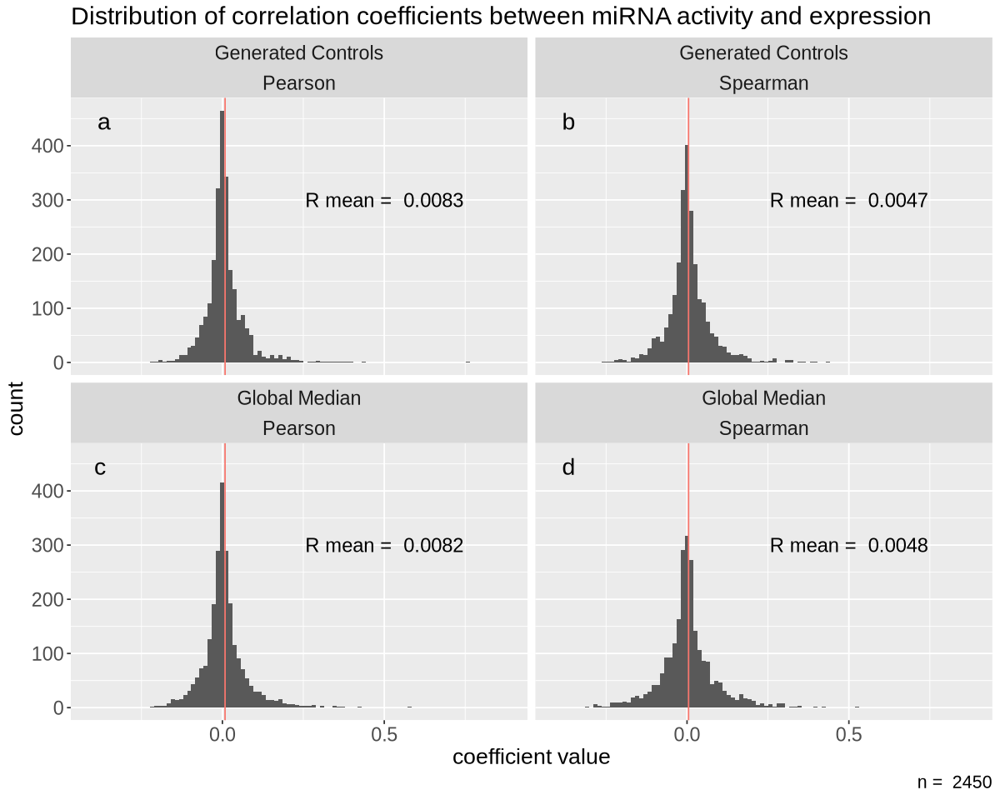

In [7]:
options(repr.plot.width=10, repr.plot.height=8)
# Create data frame containing means; used for plotting. 
means <- data.frame(Method = c("Global Median", "Global Median", "Generated Controls", "Generated Controls"),
                    Correlation_type = c("Pearson", "Spearman", "Pearson", "Spearman"),
                    coefficient_type = c("cohort_R_pearson", "cohort_R_spearman", "DGD_R_pearson", "DGD_R_spearman" ), 
                    R_coefficient = c(ad$uns$cohort_mean_R_pearson, ad$uns$cohort_mean_R_spearman, ad$uns$DGD_mean_R_pearson, ad$uns$DGD_mean_R_spearman)) %>% mutate( text = paste("R mean = ", round(R_coefficient, digits = 4), sep = " ")) 
tags <- data.frame(Method = c("Global Median", "Global Median", "Generated Controls", "Generated Controls"),
                    Correlation_type = c("Pearson", "Spearman", "Pearson", "Spearman"),
                    coefficient_type = c("cohort_R_pearson", "cohort_R_spearman", "DGD_R_pearson", "DGD_R_spearman" ), 
                    tag = c("c", "d", "a", "b")) 

 
ad$var %>%
  pivot_longer(
    cols = c(cohort_R_pearson, cohort_R_spearman, DGD_R_pearson, DGD_R_spearman),
    names_to = "coefficient_type",
    values_to = "R_coefficient"
    ) %>%
  mutate(Method = if_else(str_detect(coefficient_type, "DGD"), "Generated Controls", "Global Median"), Correlation_type = if_else(str_detect(coefficient_type, "pearson"), "Pearson", "Spearman")) %>%
  ggplot(aes(x = R_coefficient)) +
  geom_histogram(bins = 100) +
  facet_wrap(Method~Correlation_type) + 
  #facet_wrap("coefficient_type", scales = "free_y", labeller = labeller(coefficient_type = c("cohort_R_pearson" = "Pearson correlation coefficients, global median",
  #                                                                                          "cohort_R_spearman" = "Spearman correlation coefficients, global median", 
  #                                                                                          "DGD_R_pearson" = "Pearson correlation coefficients, DGD", 
  #                                                                                          "DGD_R_spearman" = "Spearman correlation coefficient, DGD"))) +
  geom_vline(aes(xintercept = R_coefficient, color = "red"), means) +
  geom_text(data = means, 
            aes(x = 0.5,  
                y =300,
                label = text
                ), 
            size = 5
            ) +
   geom_text(data = tags, 
            aes(x = -Inf,  
                y = Inf,
                label = tag
                ), 
              size = 6, 
              hjust = -2, 
              vjust = 2
            ) +
  #ylim(-0.2, 0.6) + 
  theme(legend.position="none", strip.text = element_text(size = 14), axis.text = element_text( size = 14 ), axis.title = element_text( size = 16), plot.title = element_text(size=18), text = element_text(size = 16)) + 
  labs(title = "Distribution of correlation coefficients between miRNA activity and expression", caption = paste("n = ", length(ad$var$name))) + 
  ylab("count") + xlab("coefficient value")

In [8]:
ad$var$sd_expression <- apply(ad$X, 2, sd)

In [9]:
t.test(ad$var$cohort_R_pearson, ad$var$DGD_R_pearson)


	Welch Two Sample t-test

data:  ad$var$cohort_R_pearson and ad$var$DGD_R_pearson
t = -0.056054, df = 4696, p-value = 0.9553
alternative hypothesis: true difference in means is not equal to 0
95 percent confidence interval:
 -0.004089376  0.003862027
sample estimates:
  mean of x   mean of y 
0.008174550 0.008288224 


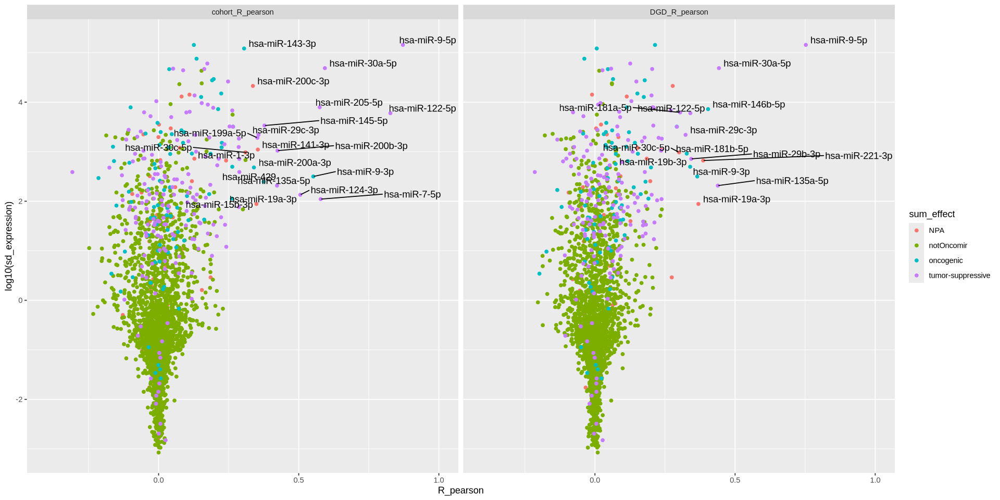

In [10]:
options(repr.plot.width=16, repr.plot.height=8)
gather_df <- ad$var %>%
        gather("method", "R_pearson", cohort_R_pearson, DGD_R_pearson)

gather_df %>%
        arrange(sum_effect) %>%
    ggplot(aes(R_pearson, log10(sd_expression), label = mature_iso_name_miRBase)) +
    geom_point( aes(color = sum_effect)) + 
    geom_text_repel(data = gather_df %>% filter(R_pearson >= 0.3), direction = "x", nudge_y = .1, hjust = 1, vjust = .5) + 
    facet_wrap("method") + 
    xlim(-0.4, 1) 
    

Warning message:
“Using `size` aesthetic for lines was deprecated in ggplot2 3.4.0.
ℹ Please use `linewidth` instead.”


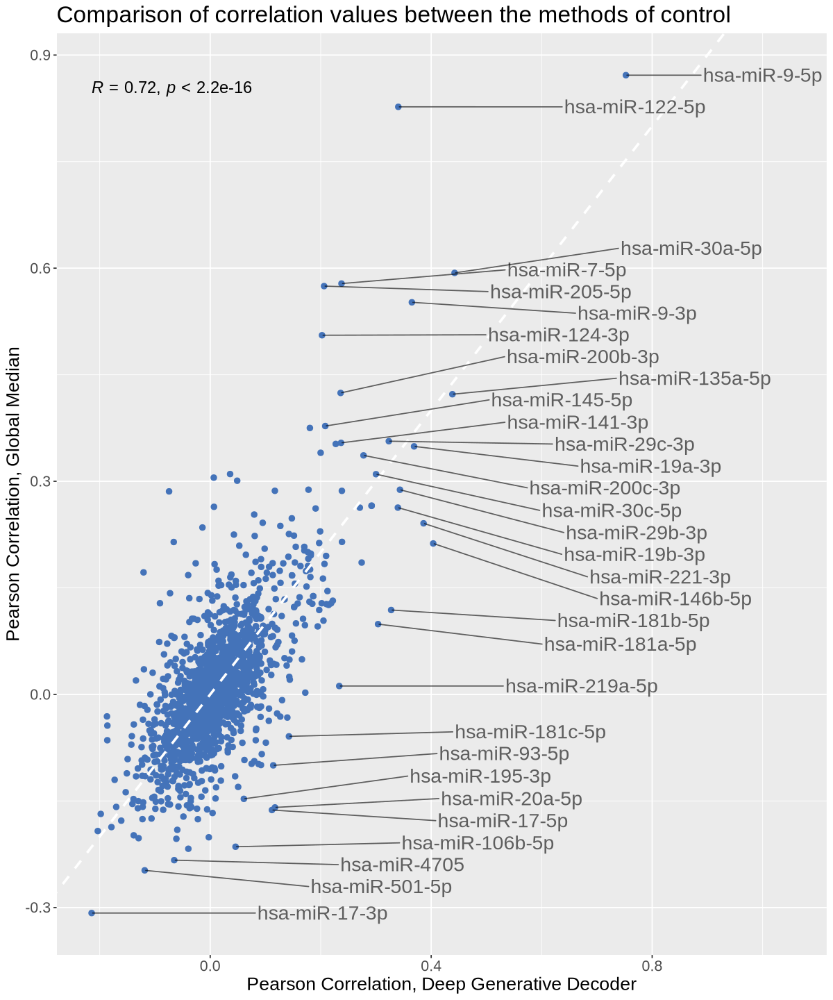

In [11]:
options(repr.plot.width=10, repr.plot.height=12)
# direction = "x", nudge_y = .1, hjust = 1, vjust = .5

ad$var %>%
    #arrange(sum_effect) %>%
    ggplot(aes(DGD_R_pearson, cohort_R_pearson, label = mature_iso_name_miRBase)) +
    geom_point(color = "#4473b9", size = 2) + 
    geom_abline(intercept = 0, slope = 1, color = "#ffffff", linetype = "dashed", size = 1 ) +
    #geom_text_repel(data = ad$var %>% filter(cohort_R_pearson + 1.2*DGD_R_pearson>= 0.65), size = 6) + 
    geom_text_repel(data = ad$var %>% filter(cohort_R_pearson^2 + DGD_R_pearson^2 >= 0.18 | cohort_R_pearson - 1*DGD_R_pearson <= -0.2 | cohort_R_pearson <= -0.23 ), 
        alpha = 0.6,
        size = 6,
        nudge_x = .3,
        direction = "y",
        vjust = .5,
        hjust = 0, 
        force_pull   = 0) +
    labs(x = "Pearson Correlation, Deep Generative Decoder", y = "Pearson Correlation, Global Median", title = "Comparison of correlation values between the methods of control") + 
    stat_cor(size = 5) + theme(plot.title = element_text(size=20), text = element_text(size = 16))

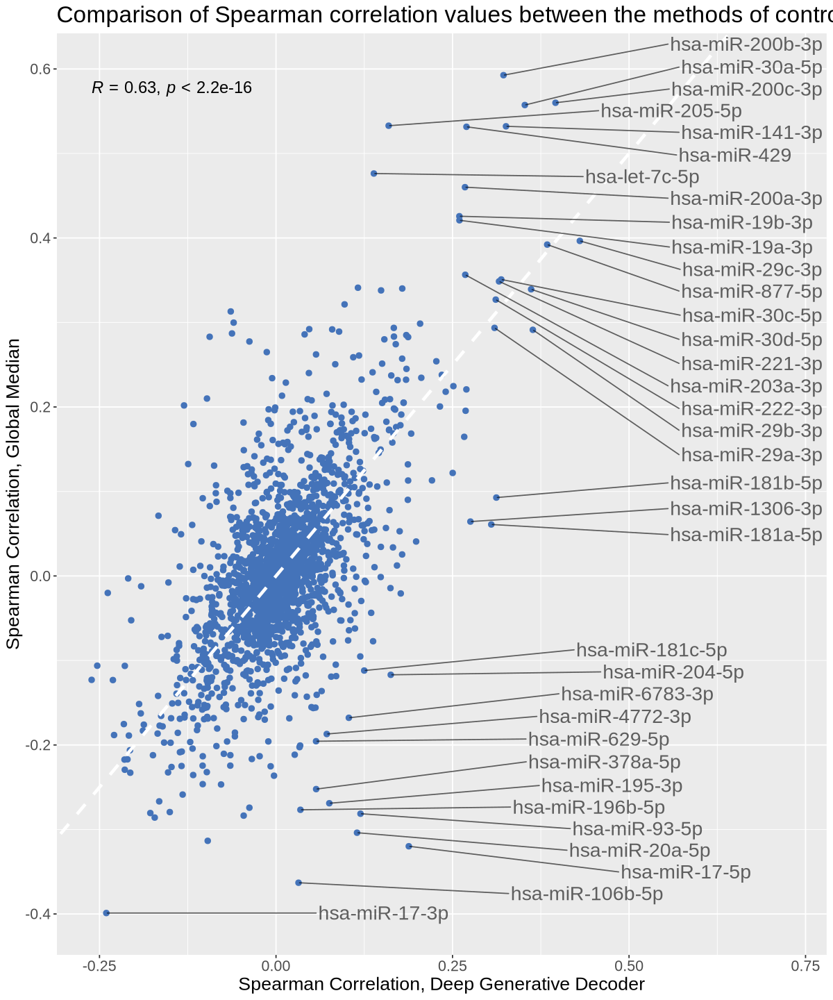

In [12]:
options(repr.plot.width=10, repr.plot.height=12)
# direction = "x", nudge_y = .1, hjust = 1, vjust = .5

ad$var %>%
    #arrange(sum_effect) %>%
    ggplot(aes(DGD_R_spearman, cohort_R_spearman, label = mature_iso_name_miRBase)) +
    geom_point(color = "#4473b9", size = 2) + 
    geom_abline(intercept = 0, slope = 1, color = "#ffffff", linetype = "dashed", size = 1.3 ) +
    #geom_text_repel(data = ad$var %>% filter(cohort_R_pearson + 1.2*DGD_R_pearson>= 0.65), size = 6) + 
    geom_text_repel(data = ad$var %>% filter(cohort_R_spearman^2 + DGD_R_spearman^2 >= 0.18), 
        alpha = 0.6,
        size = 6,
        nudge_x = .3,
        direction = "y",
        vjust = .5,
        hjust = 0, 
        force_pull   = 0) +
    geom_text_repel(data = ad$var %>% filter(cohort_R_spearman - 1.2*DGD_R_spearman <= -0.25), 
        alpha = 0.6,
        size = 6,
        nudge_x = .3,
        direction = "y",
        vjust = .5,
        hjust = 0, 
        force_pull   = 0) +
    labs(x = "Spearman Correlation, Deep Generative Decoder", y = "Spearman Correlation, Global Median", title = "Comparison of Spearman correlation values between the methods of control") + 
    stat_cor(size = 5) + theme(plot.title = element_text(size=20), text = element_text(size = 16))

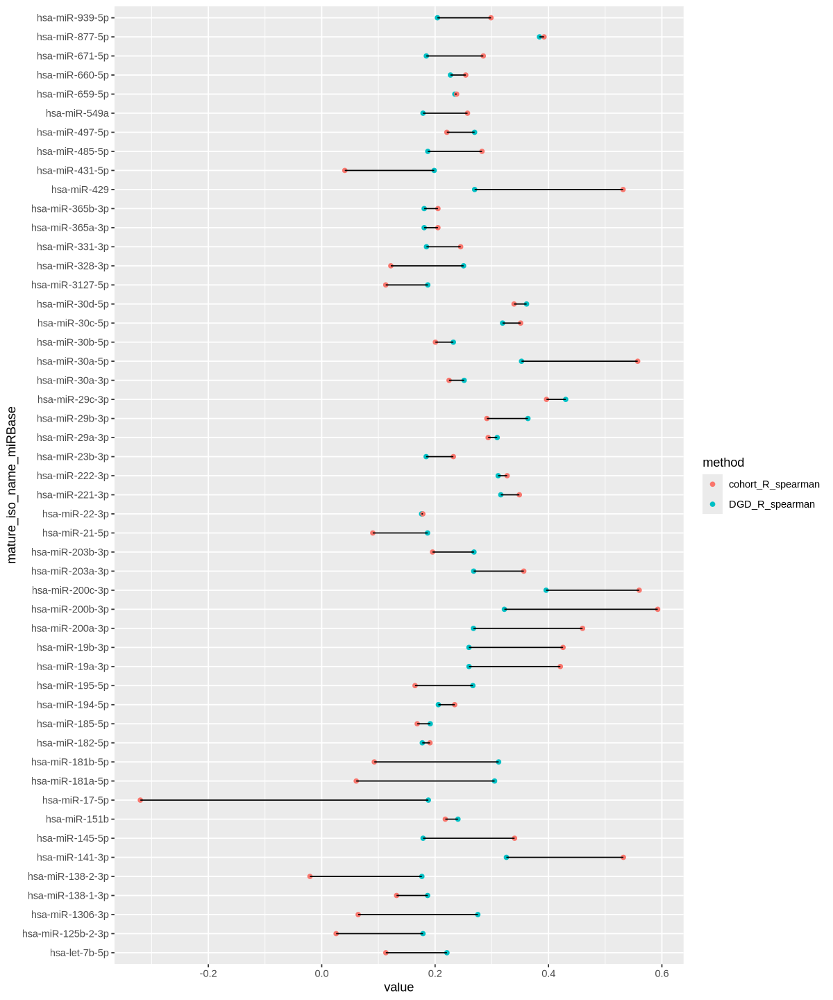

In [13]:
ad$var %>%
    slice_max(DGD_R_spearman, n = 50) %>%
    arrange(abs(DGD_R_spearman - cohort_R_pearson)) %>%
    gather("method", "value", DGD_R_spearman, cohort_R_spearman) %>%
    ggplot(aes(y =mature_iso_name_miRBase, x = value , label = mature_iso_name_miRBase)) +
    geom_point( aes(color = method)) + 
    geom_line()

Warning message in geom_boxplot(bins = 100):
“Ignoring unknown parameters: `bins`”


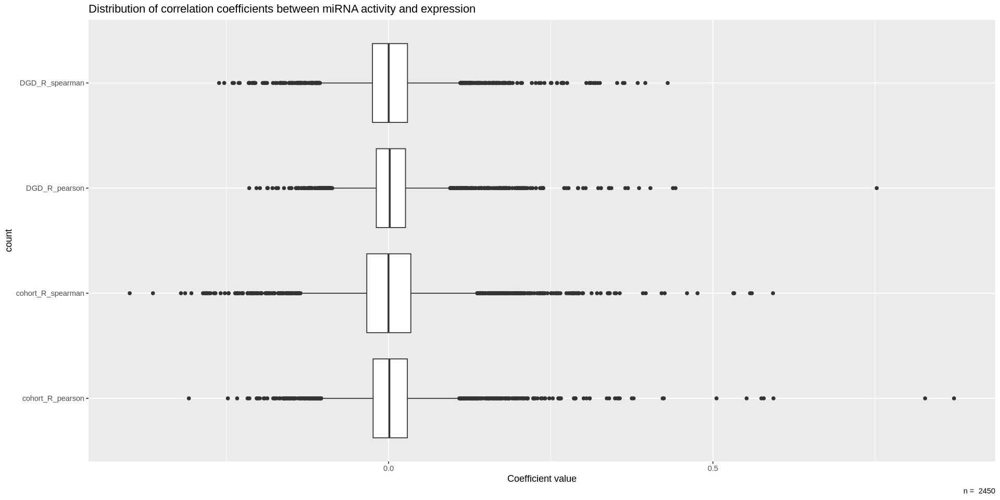

In [14]:
options(repr.plot.width=16, repr.plot.height=8)
ad$var %>%
  gather("coefficient_type", "R_coefficient", cohort_R_pearson, cohort_R_spearman, DGD_R_pearson, DGD_R_spearman) %>%
  ggplot(aes(x = R_coefficient, y = coefficient_type)) +
  geom_boxplot(bins = 100) +
  #theme(legend.position="none") + 
  labs(title = "Distribution of correlation coefficients between miRNA activity and expression", caption = paste("n = ", length(ad$var$name))) + 
  ylab("count") + xlab("Coefficient value")

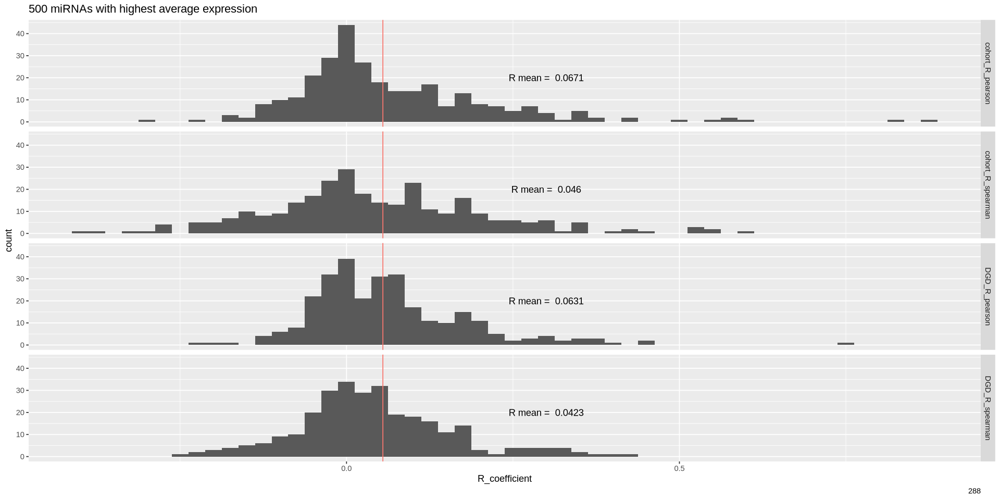

In [15]:
# Select chosen subset of miRNA from ad$var
max_R <- ad$var %>%
  filter(oncoTissue != "notOncomir")
  #slice_max(order_by = mean_expression, n = 50)

view <- ad[,max_R$name]
n = nrow(max_R)

DGD_mean_R_spearman = mean(view$var$DGD_R_spearman, na.rm = TRUE)
DGD_mean_R_pearson = mean(view$var$DGD_R_pearson, na.rm = TRUE)

cohort_mean_R_spearman = mean(view$var$cohort_R_spearman, na.rm = TRUE)
cohort_mean_R_pearson = mean(view$var$cohort_R_pearson, na.rm = TRUE)

# compute means
means <- data.frame(coefficient_type = c("cohort_R_pearson", "cohort_R_spearman", "DGD_R_pearson", "DGD_R_spearman" ), 
                    R_coefficient = c(cohort_mean_R_pearson, cohort_mean_R_spearman, DGD_mean_R_pearson, DGD_mean_R_spearman)) %>% mutate( text = paste("R mean = ", round(R_coefficient, digits = 4), sep = " ")) 

view$var %>%
  pivot_longer(
    cols = c(cohort_R_pearson, cohort_R_spearman, DGD_R_pearson, DGD_R_spearman),
    names_to = "coefficient_type",
    values_to = "R_coefficient"
    ) %>%
  ggplot(aes(x = R_coefficient, y = after_stat(count))) +
  geom_histogram(binwidth = 0.025) +
  facet_grid("coefficient_type") +
  #geom_vline(aes(xintercept = R_coefficient, color = "red"), means) +
  geom_vline(aes(xintercept = mean(R_coefficient), color = "red")) +
  geom_text(data = means, 
            aes(x = 0.3,  
                y = 20,
                label = text
                )
            ) +
  theme(legend.position = "none") + 
  labs(title = "500 miRNAs with highest average expression", caption = n)

### Testing for normal distribution of correlation coefficients

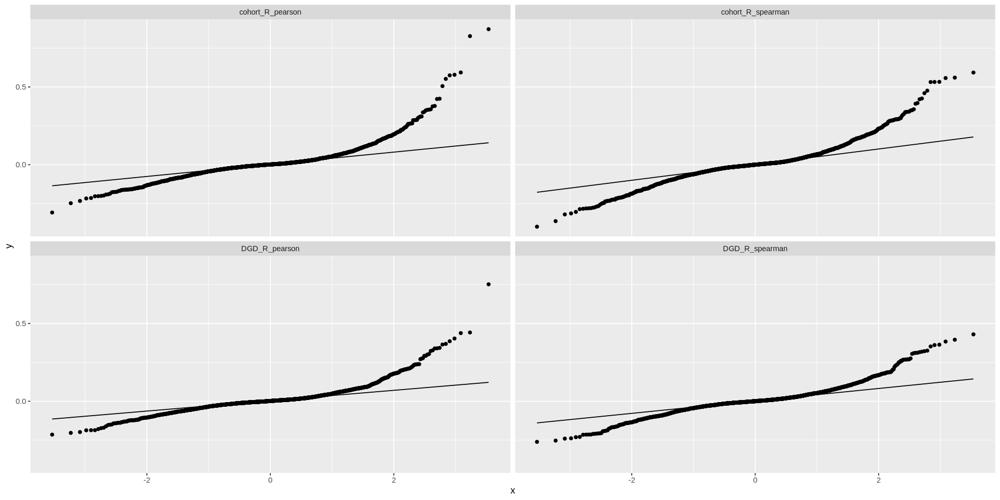

In [16]:
ad$var %>%
  pivot_longer(
    cols = c(cohort_R_pearson, cohort_R_spearman, DGD_R_pearson, DGD_R_spearman),
    names_to = "coefficient_type",
    values_to = "R_coefficient"
    ) %>%
  ggplot(aes(sample = R_coefficient)) +
  geom_qq() + 
  geom_qq_line() + 
  facet_wrap("coefficient_type", nrow =2)

## Distribution of expression and activity

### Global distribtuions

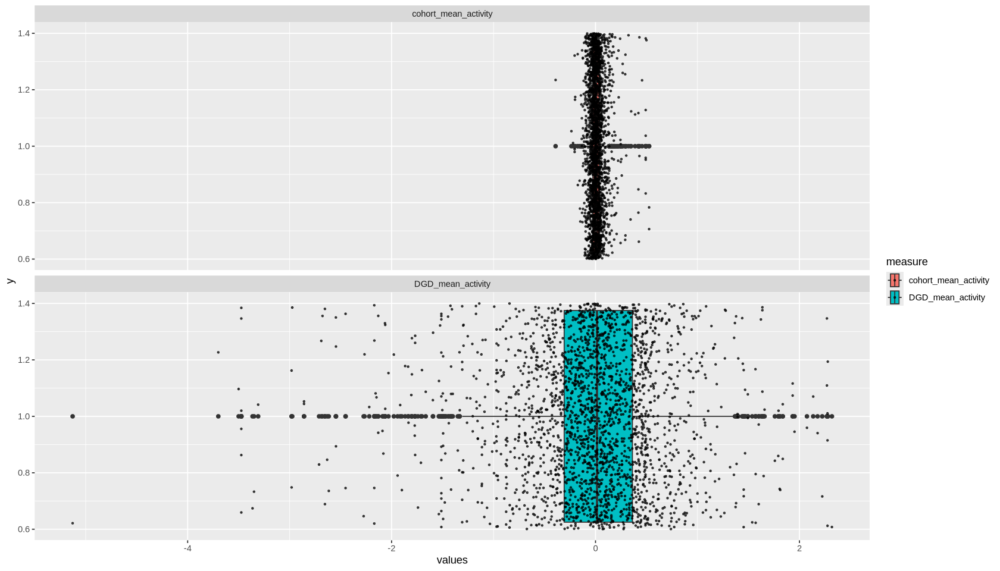

In [17]:
options(repr.plot.width=14, repr.plot.height=8)
ad$var %>%
    pivot_longer(cols = c(cohort_mean_activity, DGD_mean_activity), names_to = "measure", values_to = "values") %>%
    ggplot(aes(y = 1, x = values, fill = measure)) +
    geom_boxplot() + 
    #scale_x_continuous(trans = "log2") + 
    geom_jitter(size=0.6, alpha=0.7) + 
    facet_wrap("measure", nrow = 2)

Warning message:
“The `labeller` API has been updated. Labellers taking `variable` and `value`
arguments are now deprecated.
ℹ See labellers documentation.”


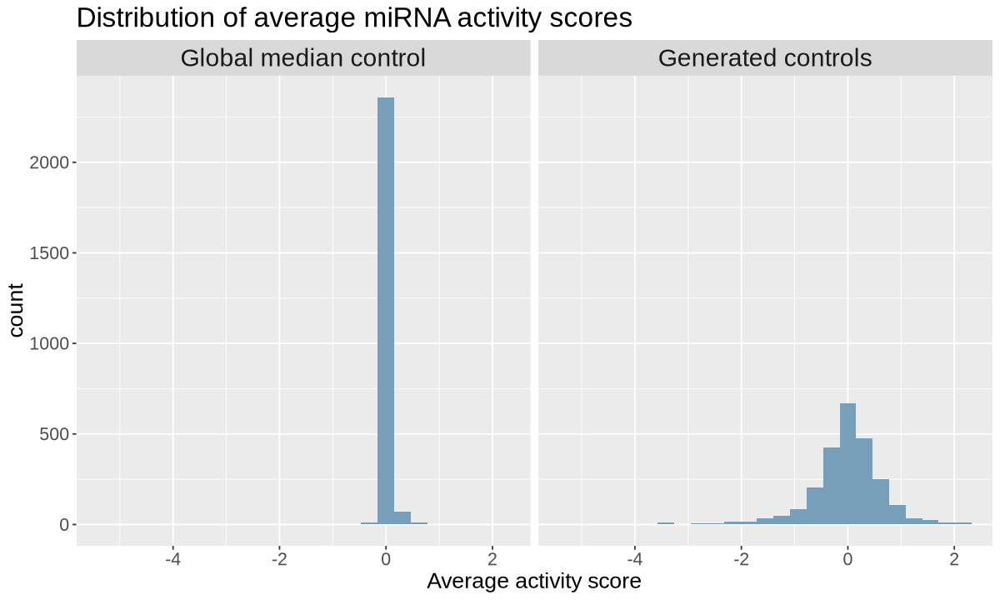

In [18]:
options(repr.plot.width=10, repr.plot.height=6)
#ad$var$cohort_median_activity <- apply(ad$layers["cohort_activity"], MARGIN = 2, FUN = median)
#ad$var$DGD_median_activity <- apply(ad$layers["DGD_activity"], MARGIN = 2, FUN = median)

facet_lables <- list('DGD_mean_activity' = "Generated controls",
                    'cohort_mean_activity' = "Global median control")

facet_labeller <- function(variable,value){
  return(facet_lables[value])
}



ad$var %>%
    pivot_longer(cols = c(cohort_mean_activity, DGD_mean_activity), names_to = "measure", values_to = "values") %>%
    ggplot(aes(x = values)) +
    geom_histogram(bins = 25, fill = "#779fba") +  
    facet_wrap("measure", labeller = facet_labeller) + 
    xlab("Average activity score") + 
    labs(title = "Distribution of average miRNA activity scores") + 
    theme(plot.title = element_text(size=20), text = element_text(size = 16), strip.text = element_text(size=18))

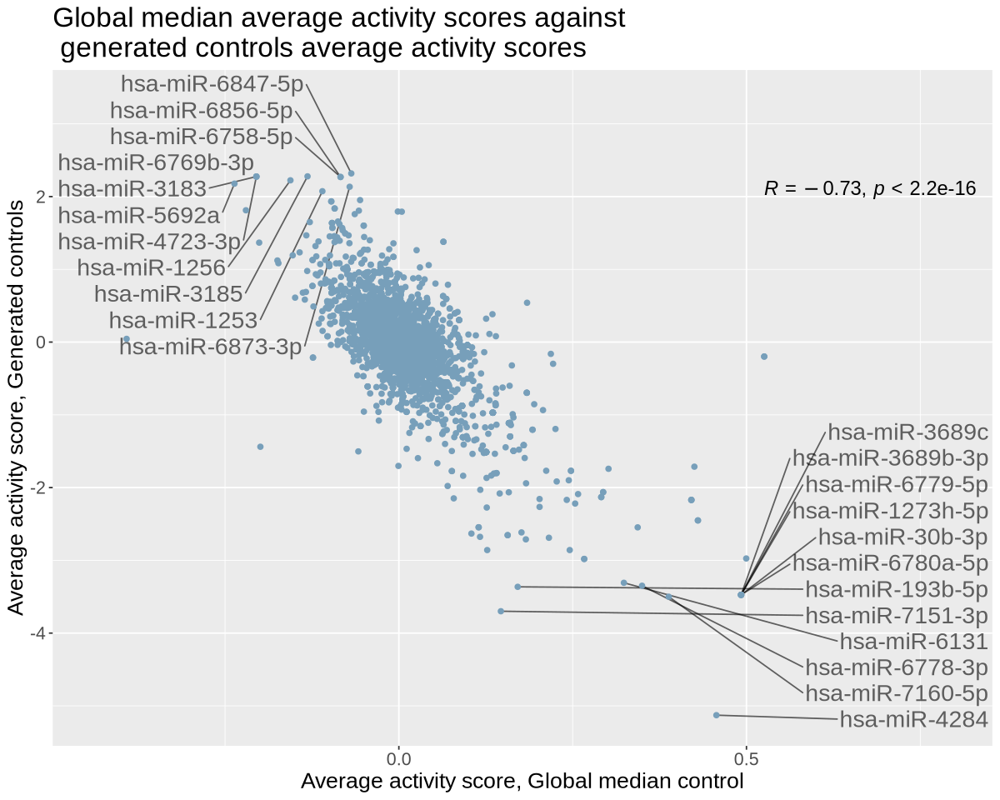

In [19]:
options(repr.plot.width=10, repr.plot.height=8) 

ad$var %>%
    ggplot(aes(cohort_mean_activity, DGD_mean_activity, label = mature_iso_name_miRBase )) +
    geom_text_repel(data = ad$var %>% filter(DGD_mean_activity <= -3), 
        alpha = 0.6,
        size = 6,
        nudge_x = .3,
        nudge_y = 1,
        direction = "y",
        vjust = 3,
        hjust = -1, 
        force_pull   = 0) +
    geom_text_repel(data = ad$var %>% filter(DGD_mean_activity >= 2 ), 
        alpha = 0.6,
        size = 6,
        nudge_x = -.2,
        nudge_y = 1,
        direction = "y",
        vjust = -.5,
        #hjust = -.5, 
        force_pull   = 0) +
    geom_point(aes(), color = "#779fba") + 
    xlab("Average activity score, Global median control") + 
    ylab("Average activity score, Generated controls") + 
    labs(title = "Global median average activity scores against \n generated controls average activity scores") + 
    theme(plot.title = element_text(size=20), text = element_text(size = 16), strip.text = element_text(size=18)) + 
    stat_cor(method = "pearson", label.x.npc = "right", size = 5) 



Picking joint bandwidth of 0.238

Picking joint bandwidth of 0.147

Warning message:
“Removed 95 rows containing non-finite outside the scale range
(`stat_density_ridges()`).”
Picking joint bandwidth of 0.241

Picking joint bandwidth of 0.157

Warning message:
“Removed 1364 rows containing non-finite outside the scale range
(`stat_density_ridges()`).”


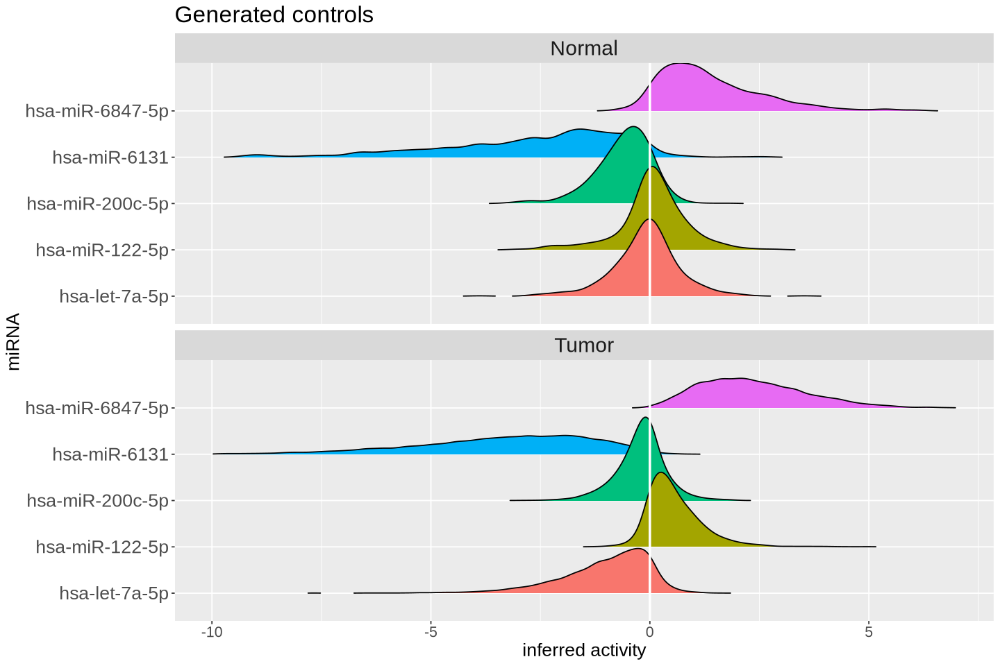

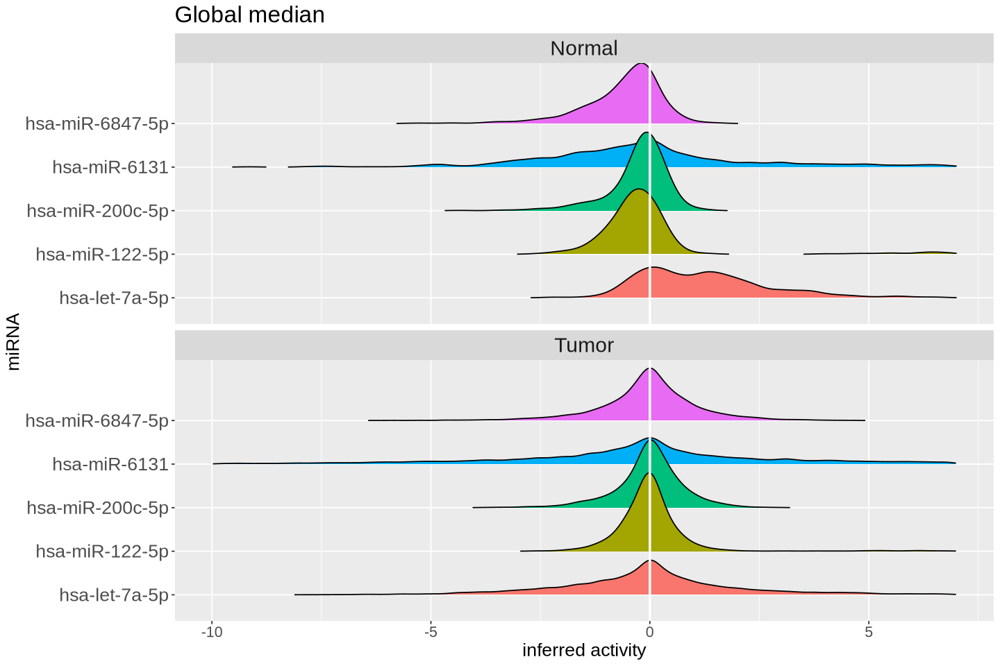

In [20]:
options(repr.plot.width=12, repr.plot.height=8)

name_list =  c("hsa-miR-122-5p", "hsa-let-7a-5p", "hsa-miR-200c-5p", "hsa-miR-6131", "hsa-miR-6847-5p" )

n_tumor = nrow(ad$obs %>% filter(tissue_type == "Tumor"))
n_normal = nrow(ad$obs %>% filter(tissue_type == "Normal"))

df %>%
    filter(miRNA %in% name_list)%>%
    ggplot(aes(x = DGD_activity, fill = miRNA)) + 
    geom_density_ridges(aes(y = miRNA), rel_min_height = 0.001) +
    #theme_ridges() + 
    geom_vline(xintercept = 0, color = "white", size = 1) + 
    xlim(-10, 7) + 
    labs(title = "Generated controls") + 
    facet_wrap("tissue_type", ncol = 1) + 
    xlab("inferred activity") + 
    theme(legend.position = "none", plot.title = element_text(size=20), text = element_text(size = 16), strip.text = element_text(size=18), axis.text.y = element_text(size = 16))

df %>%
    filter(miRNA %in% name_list)%>%
    ggplot(aes(x = GM_activity, fill = miRNA)) + 
    geom_density_ridges(aes(y = miRNA), rel_min_height = 0.001) +
    #theme_ridges() + 
    geom_vline(xintercept = 0, color = "white", size = 1) + 
    xlim(-10, 7) + 
    labs(title = "Global median") +
    facet_wrap("tissue_type", ncol = 1) + 
    xlab("inferred activity") + 
    theme(legend.position = "none", plot.title = element_text(size=20), text = element_text(size = 16), strip.text = element_text(size=18), axis.text.y = element_text(size = 16))

`stat_bin()` using `bins = 30`. Pick better value with `binwidth`.


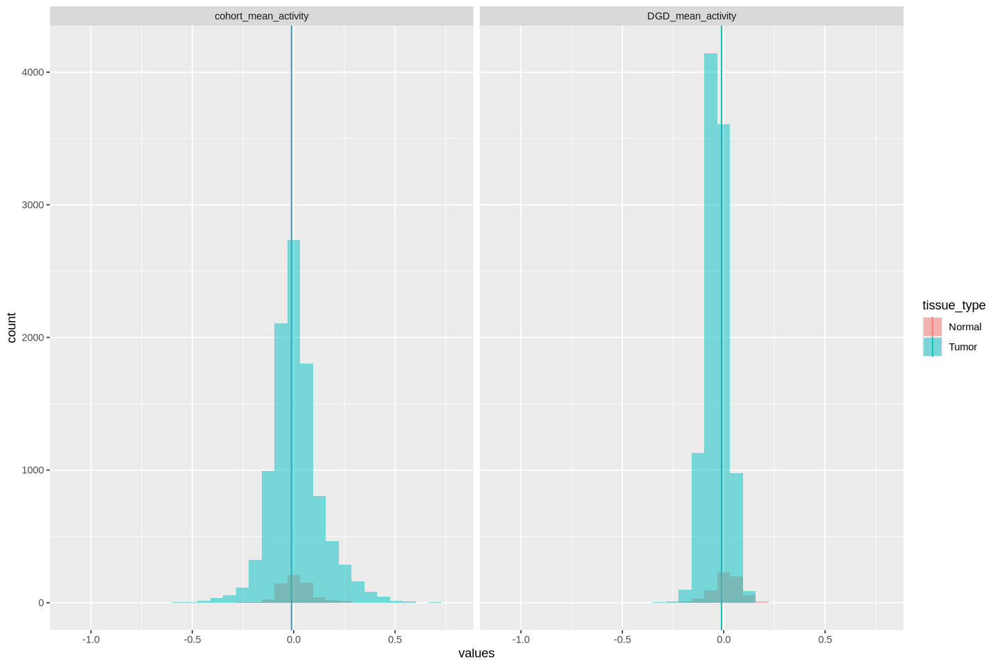

In [21]:
ad$obs$cohort_mean_activity <- rowMeans(ad$layers["cohort_activity"]) 
ad$obs$DGD_mean_activity <- rowMeans(ad$layers["DGD_activity"]) 

ad$obs %>% 
    arrange(tissue_type) %>%
    pivot_longer(cols = c(cohort_mean_activity, DGD_mean_activity), names_to = "measure", values_to = "values") %>%
    ggplot(aes(x = values, fill = tissue_type )) +
    geom_vline(aes(xintercept = mean(values), color = tissue_type)) +
    geom_histogram(position = "identity", alpha = 0.5) + 
    facet_wrap("measure")


### Specific miRNA

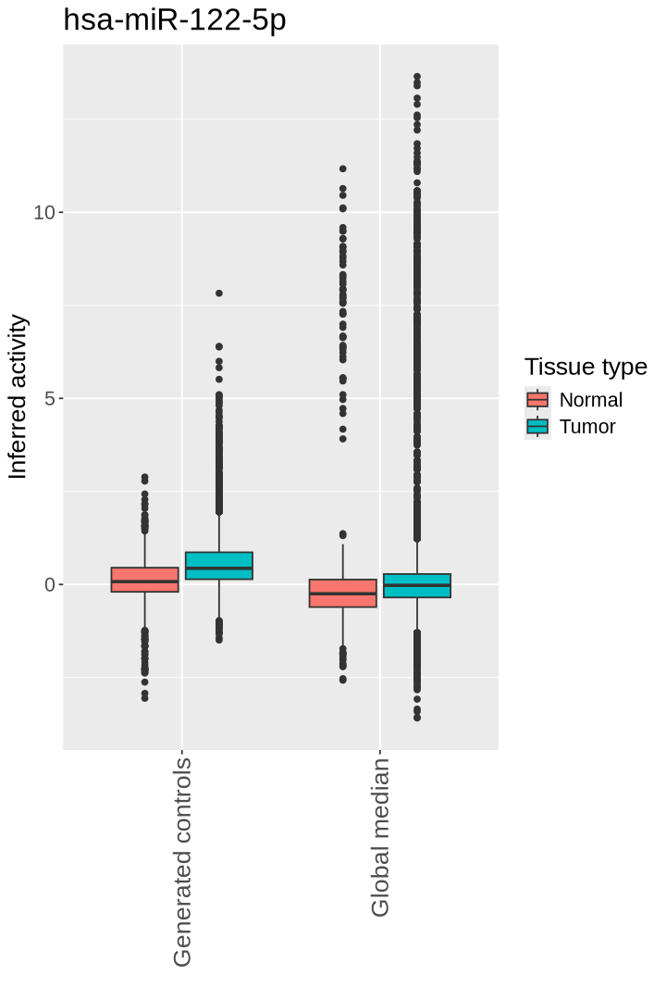

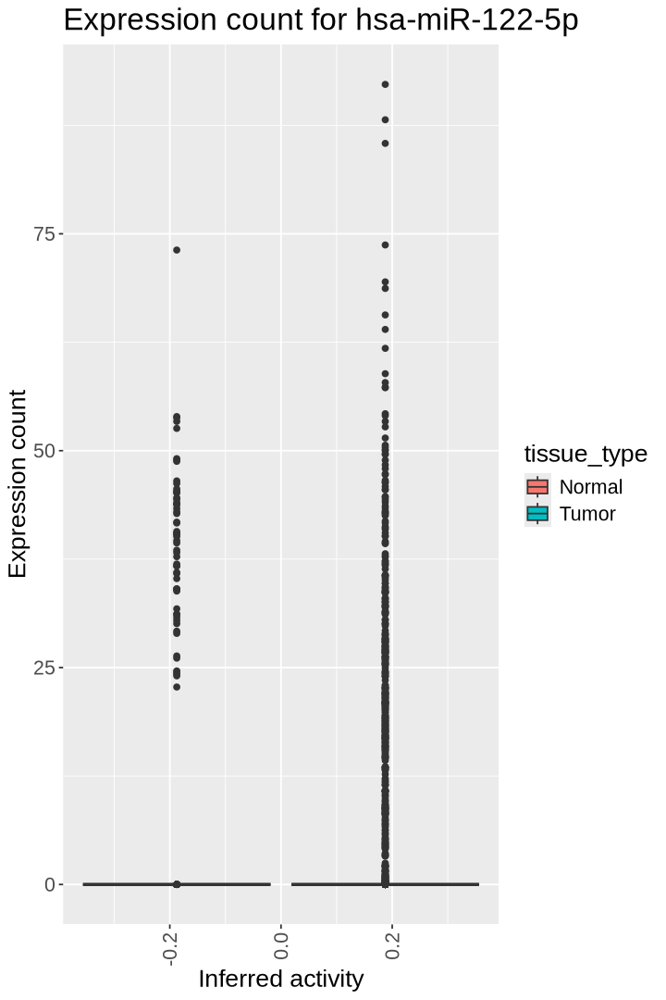

In [22]:
options(repr.plot.width=6, repr.plot.height=9)

name = "hsa-miR-122-5p"
dat_df <- df %>% filter(miRNA == name) %>% arrange(desc(tissue_type))

dat_df %>%
    gather("method", "value", DGD_activity, GM_activity) %>%
    ggplot(aes(y = value, x = method)) +
    geom_boxplot(aes(fill = tissue_type)) +
    labs(title = paste0(name)) +
    scale_fill_discrete(name = "Tissue type") + 
    ylab("Inferred activity") +
    xlab(" ") +
    theme(axis.text.x = element_text(angle = 90, vjust = 0.5, hjust = 1, size = 16))  +
    theme(plot.title = element_text(size=20), text = element_text(size = 16)) + 
    scale_x_discrete(labels = c("DGD_activity"= "Generated controls", "GM_activity" = "Global median")) + 
    NULL

dat_df %>%
    ggplot(aes(y = expression/1000, fill = tissue_type)) +
    geom_boxplot(aes(fill = tissue_type)) +
    #geom_hline(intercept = 2, color = "white") + 
    labs(title = paste0("Expression count for ", name)) +
    scale_color_discrete(name = "Tissue type") +
    #xlim(-5, 5) + 
    xlab("Inferred activity") +
    ylab("Expression count") +
    theme(axis.text.x = element_text(angle = 90, vjust = 0.5, hjust = 1)) +
    theme(plot.title = element_text(size=20), text = element_text(size = 16)) + 
    #facet_wrap("cancer_type", scales = "free") + 
    #scale_color_manual(values = c("#e96969", "#18d3dc", "#d81818", "#071f65"), name = "Tissue type") +
    NULL

In [23]:
head(ad$var$comp_name)

NULL

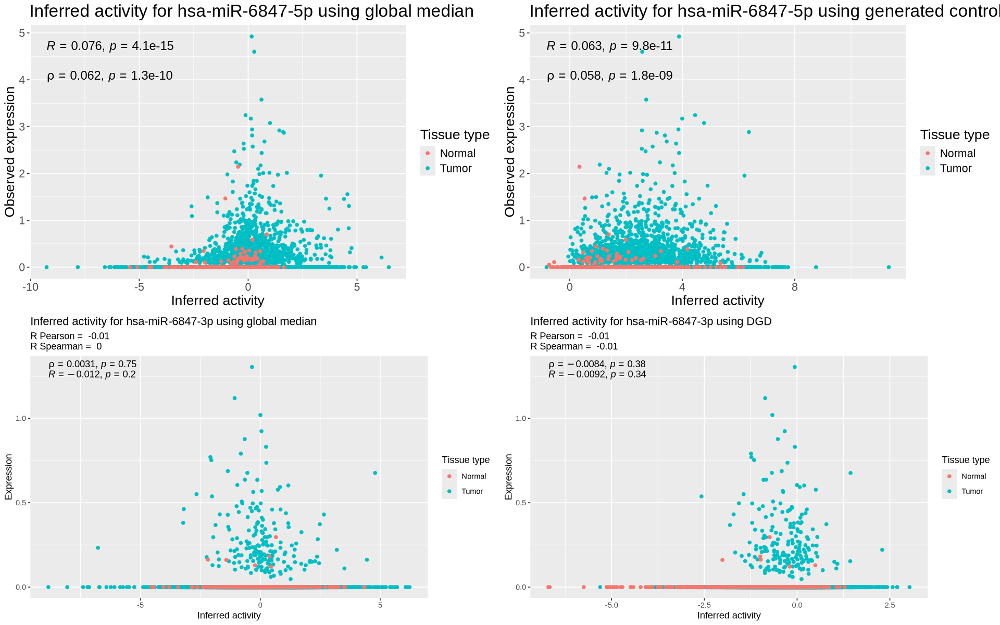

In [24]:
options(repr.plot.width=16, repr.plot.height=10)
nb = "6847"

name = paste0("hsa-miR-", nb, "-5p")
#name = "hsa-miR-4284"
site = "Kidney"
# ad[,name]$obs$primary_site %in% "Kidney"

dat <- df %>% filter(miRNA == name) # %>% filter(primary_site %in% site)

# , subtitle = paste("R Pearson = ", round(ad[,name]$var$cohort_R_pearson, digits = 2), "\nR Spearman = ", round(ad[,name]$var$cohort_R_spearman, digits = 2))

p1 <- dat %>%
    arrange(desc(tissue_type)) %>%
    ggplot(aes(y = expression, x = GM_activity)) +
    stat_cor(cor.coef.name = c("R"), size = 5) +  
    stat_cor(method = "spearman", cor.coef.name = c("rho"), label.y = Inf, vjust = 5, size = 5 ) +  
    geom_point(aes(color = tissue_type)) + 
    labs(title = paste0("Inferred activity for ", name, " using global median")) + 
    scale_color_discrete(name = "Tissue type") + 
    #ylim(0,2500) + 
    xlab("Inferred activity") + 
    ylab("Observed expression") +
    theme(plot.title = element_text(size=20), text = element_text(size = 16)) + 
    NULL

# subtitle = paste("R Pearson = ", round(ad[,name]$var$DGD_R_pearson, digits = 2), "\nR Spearman = ", round(ad[,name]$var$DGD_R_spearman, digits = 2))

p2 <- dat %>%
    arrange(desc(tissue_type)) %>%
    ggplot(aes(y = expression , x = DGD_activity)) + 
    stat_cor(cor.coef.name = c("R"), size = 5) +  
    stat_cor(method = "spearman", cor.coef.name = c("rho"), label.y = Inf, vjust = 5, size = 5 ) +  
    geom_point(aes(color = tissue_type))  + 
    labs(title = paste0("Inferred activity for ", name, " using generated controls")) + 
    scale_color_discrete(name = "Tissue type") + 
    #ylim(0,2500) +
    xlab("Inferred activity") + 
    ylab("Observed expression") +
    theme(plot.title = element_text(size=20), text = element_text(size = 16)) +
    NULL

name = paste0("hsa-miR-", nb, "-3p")

dat <- df %>% filter(miRNA == name) # %>% filter(primary_site %in% site)

p3 <- dat %>%
    arrange(desc(tissue_type)) %>%
    ggplot(aes(y = expression, x = GM_activity)) + 
    stat_cor(cor.coef.name = c("R")) +  
    stat_cor(method = "spearman", cor.coef.name = c("rho"), label.y = Inf, vjust = 1.5 ) + 
    geom_point(aes(color = tissue_type)) + 
    labs(title = paste0("Inferred activity for ", name, " using global median"), subtitle = paste("R Pearson = ", round(ad[,name]$var$cohort_R_pearson, digits = 2), "\nR Spearman = ", round(ad[,name]$var$cohort_R_spearman, digits = 2))) + 
    scale_color_discrete(name = "Tissue type") + 
    xlab("Inferred activity") + 
    ylab("Expression") +
    NULL

p4 <- dat %>%
    arrange(desc(tissue_type)) %>%
    ggplot(aes(y = expression, x = DGD_activity)) + 
    stat_cor(cor.coef.name = c("R")) +  
    stat_cor(method = "spearman", cor.coef.name = c("rho"), label.y = Inf, vjust = 1.5 ) + 
    geom_point(aes(color = tissue_type))  + 
    labs(title = paste0("Inferred activity for ", name, " using DGD"), subtitle = paste("R Pearson = ", round(ad[,name]$var$DGD_R_pearson, digits = 2), "\nR Spearman = ", round(ad[,name]$var$DGD_R_spearman, digits = 2))) + 
    scale_color_discrete(name = "Tissue type") + 
    xlab("Inferred activity") + 
    ylab("Expression") +
    NULL
grid.arrange(p1, p2, p3, p4, ncol = 2)

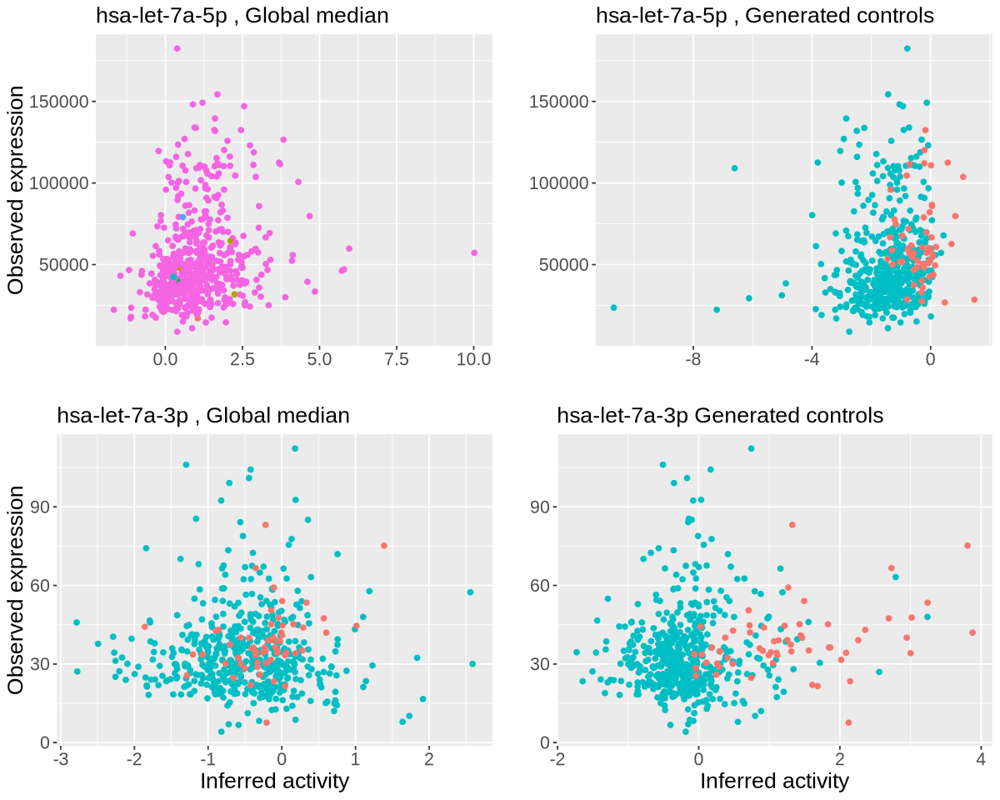

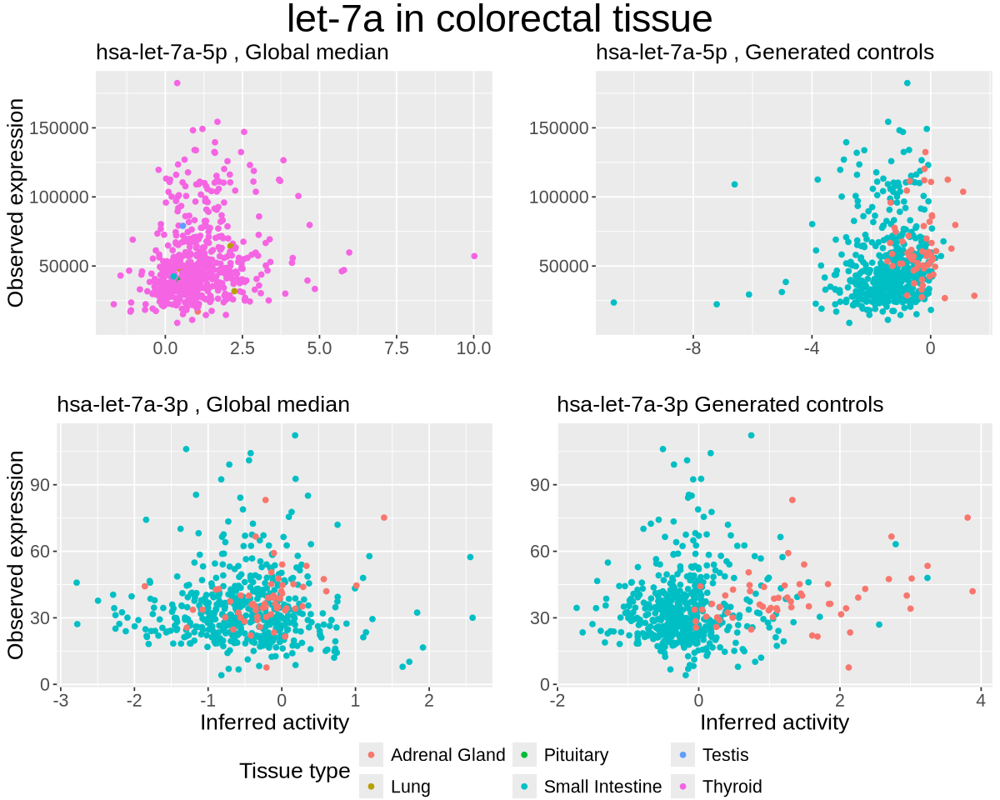

In [25]:
options(repr.plot.width=10, repr.plot.height=8)
nb = "7a"

name = paste0("hsa-let-", nb, "-5p")
site = "Thyroid"
# ad[,name]$obs$primary_site %in% "Kidney"

dat <- df %>% filter(miRNA == name) %>% filter(primary_site %in% site)

p1 <- dat %>%
    arrange(desc(tissue_type)) %>%
    ggplot(aes(y = expression, x = GM_activity)) +
    geom_point(aes(color = comp_name)) + 
    labs(title = paste0(name, " , Global median")) + 
    scale_color_discrete(name = "Tissue type") + 
    #ylim(0,2500) + 
    xlab(" ") + 
    ylab("Observed expression") +
    theme(plot.title = element_text(size=16), text = element_text(size = 16), legend.position = "bottom") + 
    NULL

p2 <- dat %>%
    arrange(desc(tissue_type)) %>%
    ggplot(aes(y = expression , x = DGD_activity)) +
    geom_point(aes(color = tissue_type))  + 
    labs(title = paste0(name, " , Generated controls")) + 
    scale_color_discrete(name = "Tissue type") + 
    #ylim(0,2500) +
    xlab(" ") + 
    ylab(" ") +
    theme(plot.title = element_text(size=16), text = element_text(size = 16)) +
    theme( legend.position = "none" ) + 
    NULL

name = paste0("hsa-let-", nb, "-3p")

dat <- df %>% filter(miRNA == name) %>% filter(primary_site %in% site)

p3 <- dat %>%
    arrange(desc(tissue_type)) %>%
    ggplot(aes(y = expression, x = GM_activity)) + 
    geom_point(aes(color = tissue_type)) + 
    labs(title = paste0( name, " , Global median")) + 
    scale_color_discrete(name = "Tissue type") + 
    xlab("Inferred activity") + 
    ylab("Observed expression") +
    theme(plot.title = element_text(size=16), text = element_text(size = 16)) +
    theme( legend.position = "none" ) + 
    NULL

p4 <- dat %>%
    arrange(desc(tissue_type)) %>%
    ggplot(aes(y = expression, x = DGD_activity)) + 
    geom_point(aes(color = tissue_type))  + 
    labs(title = paste0(name, " Generated controls")) + 
    scale_color_discrete(name = "Tissue type") + 
    xlab("Inferred activity") + 
    ylab(" ") +
    theme(plot.title = element_text(size=16), text = element_text(size = 16)) +
    theme( legend.position = "none" ) + 
    NULL

get_only_legend <- function(plot) { 
    
# get tabular interpretation of plot 
plot_table <- ggplot_gtable(ggplot_build(plot))  
    
#  Mark only legend in plot 
legend_plot <- which(sapply(plot_table$grobs, function(x) x$name) == "guide-box")  
                              
# extract legend 
legend <- plot_table$grobs[[legend_plot]] 
                              
# return legend 
return(legend)  
}

legend <- get_only_legend(p1)

combined_plot <- grid.arrange(p1 + theme( legend.position = "none" ), p2, p3, p4, ncol = 2)

grid.arrange(combined_plot, legend, ncol = 1, heights = c(12, 1), top=textGrob("let-7a in colorectal tissue", gp=gpar(fontsize=28,font=8)))

In [26]:

get_only_legend <- function(plot) { 
    
# get tabular interpretation of plot 
plot_table <- ggplot_gtable(ggplot_build(plot))  
    
#  Mark only legend in plot 
legend_plot <- which(sapply(plot_table$grobs, function(x) x$name) == "guide-box")  
                              
# extract legend 
legend <- plot_table$grobs[[legend_plot]] 
                              
# return legend 
return(legend)  
}

legend <- get_only_legend(p1)

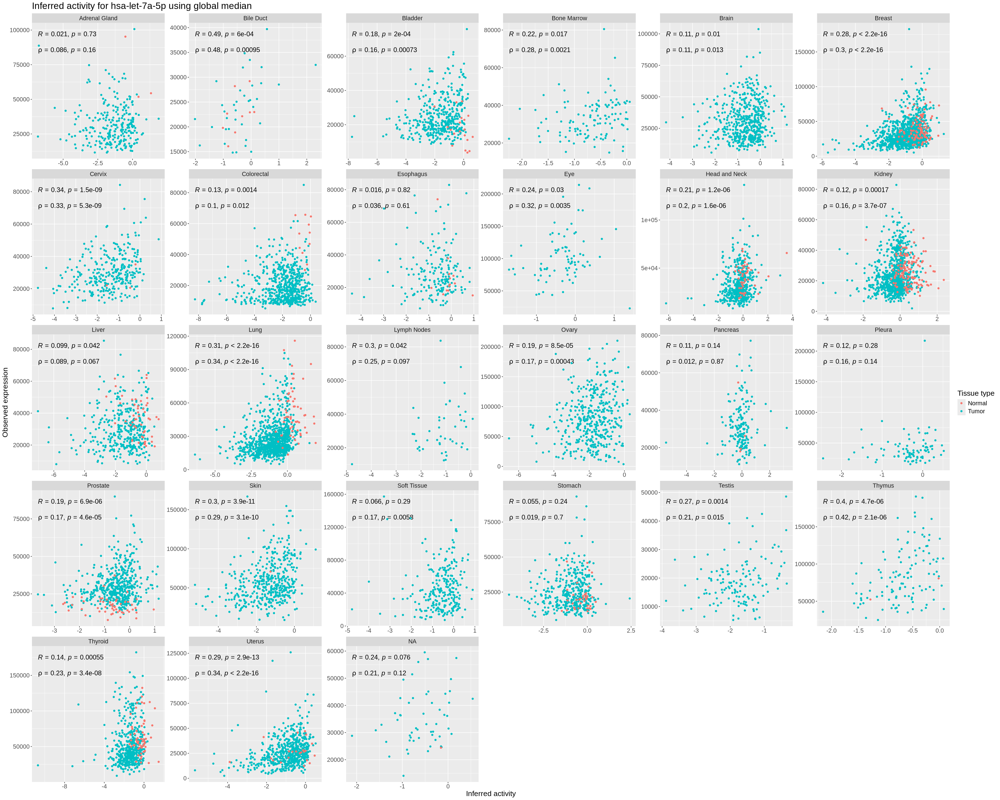

In [27]:
options(repr.plot.width=30, repr.plot.height=24)

nb = "7a"

name = paste0("hsa-let-", nb, "-5p")
site = "Kidney"
dat <- df %>% filter(miRNA == name) # %>% filter(primary_site %in% site)

dat %>%
    arrange(desc(tissue_type)) %>%
    ggplot(aes(y = expression, x = DGD_activity)) +
    stat_cor(cor.coef.name = c("R"), size = 5) +  
    stat_cor(method = "spearman", cor.coef.name = c("rho"), label.y = Inf, vjust = 5, size = 5 ) +  
    geom_point(aes(color = tissue_type)) + 
    labs(title = paste0("Inferred activity for ", name, " using global median")) + 
    scale_color_discrete(name = "Tissue type") + 
    #ylim(0,2500) + 
    xlab("Inferred activity") + 
    ylab("Observed expression") +
    theme(plot.title = element_text(size=20), text = element_text(size = 16)) + 
    facet_wrap("primary_site", scales = "free") + 
    NULL

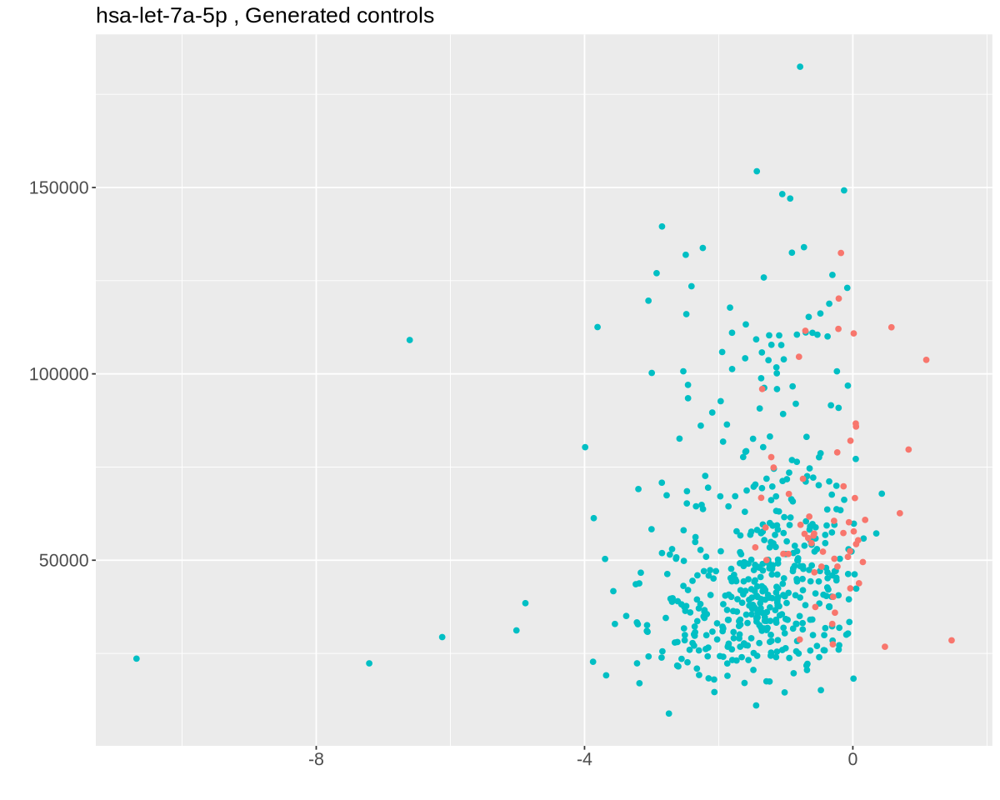

In [28]:
options(repr.plot.width=10, repr.plot.height=8)
p2

In [29]:
print(length(unique(ad$obs$primary_site)))

keep = c("Adrenocortical Carcinoma",
        "Bladder Urothelial Carcinoma",
        "Brain Lower Grade Glioma",
        "Breast Invasive Carcinoma",
        "Colon Adenocarcinoma",
        "Esophageal Carcinoma",
        "Kidney Chromophobe",
        "Kidney Renal Clear Cell Carcinoma",
        "Kidney Renal Papillary Cell Carcinoma",
        "Liver Hepatocellular Carcinoma",
        "Lung Adenocarcinoma",
        "Prostate Adenocarcinoma",
        "Stomach Adenocarcinoma",
        "Thyroid Carcinoma")

ad$obs %>% 
    #filter(cancer_name %in% keep) %>%
    group_by(cancer_name, cancer_type, primary_site) %>%
    summarise(count = n())

[1] 27


`summarise()` has grouped output by 'cancer_name', 'cancer_type'. You can
override using the `.groups` argument.


cancer_name,cancer_type,primary_site,count
<fct>,<fct>,<fct>,<int>
ACUTE MYELOID LEUKEMIA,LAML,NA,52
Acute Myeloid Leukemia,LAML,Bone Marrow,121
Adrenocortical Carcinoma,ACC,Adrenal Gland,79
BREAST INVASIVE CARCINOMA,BRCA,NA,1
Bladder Urothelial Carcinoma,BLCA,Bladder,422
Brain Lower Grade Glioma,LGG,Brain,527
Breast Invasive Carcinoma,BRCA,Breast,1178
Cervical Squamous Cell Carcinoma and Endocervical Adenocarcinoma,CESC,Cervix,309
Cholangiocarcinoma,CHOL,Bile Duct,45


Scale for colour is already present.
Adding another scale for colour, which will replace the existing scale.
Scale for colour is already present.
Adding another scale for colour, which will replace the existing scale.
Scale for colour is already present.
Adding another scale for colour, which will replace the existing scale.
Warning message:
“Removed 3 rows containing non-finite outside the scale range
(`stat_summary_bin()`).”
Warning message:
“Removed 3 rows containing missing values or values outside the scale range
(`geom_point()`).”


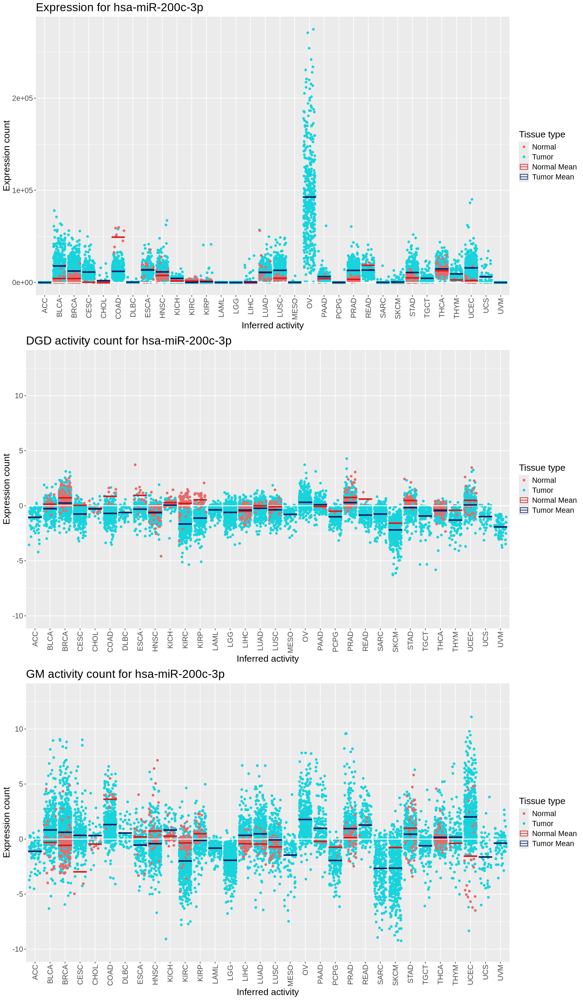

In [30]:
options(repr.plot.width=14, repr.plot.height=24)

name = "hsa-miR-200c-3p"

dat_df <- df %>% filter(miRNA == name) %>% arrange(desc(tissue_type)) # %>%  filter(cancer_name %in% keep)

p1 <- dat_df %>%
    ggplot(aes(cancer_type, expression )) +
    geom_jitter(aes(color = tissue_type)) +
    geom_hline(aes(yintercept = 0), color = "white", linewidth = 0.75) +
    labs(title = paste0("Expression for ", name)) +
    scale_color_discrete(name = "Tissue type") +
    xlab("Inferred activity") +
    ylab("Expression count") +
    #ylim(0, 1) +
    stat_summary_bin(fun = mean, geom = "crossbar", aes(group = tissue_type, color = paste0(tissue_type, " Mean"))) +
    # stat_summary(fun.data = ~ round(data.frame(mean = mean(.x)), 0), geom = "text", aes(label = after_stat(mean), group = tissue_type, y = stage(expression, after_stat = mean + 2000))) +
    theme(axis.text.x = element_text(angle = 90, vjust = 0.5, hjust = 1), plot.title = element_text(size=20), text = element_text(size = 16)) +
    scale_color_manual(values = c("#e96969", "#18d3dc", "#d81818", "#071f65"), name = "Tissue type") +
    theme(plot.title = element_text(size=20), text = element_text(size = 16)) +
    NULL

p2 <- dat_df %>%
    ggplot(aes(cancer_type, DGD_activity)) +
    geom_jitter(aes(color = tissue_type)) +
    geom_hline(aes(yintercept = 0), color = "white", linewidth = 0.75) +
    labs(title = paste0("DGD activity count for ", name)) +
    scale_color_discrete(name = "Tissue type") +
    xlab("Inferred activity") +
    ylab("Expression count") +
    ylim(-10, 13) +
    stat_summary_bin(fun = mean, geom = "crossbar", aes(group = tissue_type, color = paste0(tissue_type, " Mean"))) +
    # stat_summary(fun.data = ~ round(data.frame(mean = mean(.x)), 0), geom = "text", aes(label = after_stat(mean), group = tissue_type, y = stage(expression, after_stat = mean + 2000))) +
    theme(axis.text.x = element_text(angle = 90, vjust = 0.5, hjust = 1), plot.title = element_text(size=20), text = element_text(size = 16)) +
    scale_color_manual(values = c("#e96969", "#18d3dc", "#d81818", "#071f65"), name = "Tissue type") +
    NULL

p3 <- dat_df %>%
    ggplot(aes(cancer_type, GM_activity)) +
    geom_jitter(aes(color = tissue_type)) +
    geom_hline(aes(yintercept = 0), color = "white", linewidth = 0.75) +
    labs(title = paste0("GM activity count for ", name)) +
    scale_color_discrete(name = "Tissue type") +
    xlab("Inferred activity") +
    ylab("Expression count") +
    ylim(-10, 13) +
    stat_summary_bin(fun = mean, geom = "crossbar", aes(group = tissue_type, color = paste0(tissue_type, " Mean"))) +
    # stat_summary(fun.data = ~ round(data.frame(mean = mean(.x)), 0), geom = "text", aes(label = after_stat(mean), group = tissue_type, y = stage(expression, after_stat = mean + 2000))) +
    theme(axis.text.x = element_text(angle = 90, vjust = 0.5, hjust = 1), plot.title = element_text(size=20), text = element_text(size = 16)) +
    scale_color_manual(values = c("#e96969", "#18d3dc", "#d81818", "#071f65"), name = "Tissue type") +
    NULL

grid.arrange(p1, p2, p3, ncol = 1)

Warning message in geom_jitter(aes(color = tissue_type, vjust = 0)):
“Ignoring unknown aesthetics: vjust”
Scale for colour is already present.
Adding another scale for colour, which will replace the existing scale.
Warning message:
“The `labeller` API has been updated. Labellers taking `variable` and `value`
arguments are now deprecated.
ℹ See labellers documentation.”


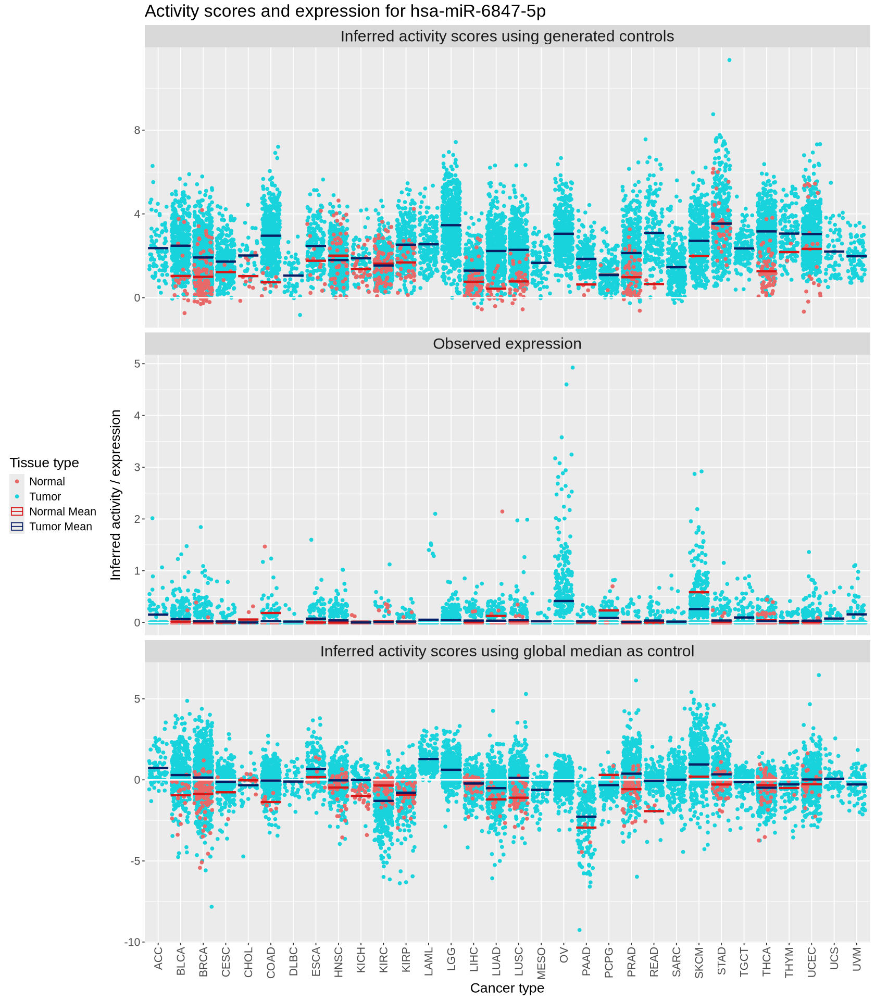

In [31]:
options(repr.plot.width=14, repr.plot.height=16)

name = "hsa-miR-6847-5p"

dat_df <- df %>% filter(miRNA == name) %>% arrange(desc(tissue_type)) # %>%  filter(cancer_name %in% keep)

facet_labes <- list('DGD_activity' = "Inferred activity scores using generated controls",
                    'expression' = "Observed expression", 
                    'GM_activity' = "Inferred activity scores using global median as control")

facet_labeller <- function(variable,value){
  return(facet_labes[value])
}


dat_df %>%
    gather("method", "value", expression,  DGD_activity, GM_activity) %>% 
    ggplot(aes(cancer_type, value)) +
    geom_jitter(aes(color = tissue_type, vjust = 0)) +
    geom_hline(aes(yintercept = 0), color = "white", linewidth = 0.75) +
    labs(title = paste0("Activity scores and expression for ", name)) +
    scale_color_discrete(name = "Tissue type") +
    xlab("Cancer type") +
    ylab("Inferred activity / expression") +
    #ylim(0, 1) +
    stat_summary_bin(fun = mean, geom = "crossbar", aes(group = tissue_type, color = paste0(tissue_type, " Mean"))) +
    # stat_summary(fun.data = ~ round(data.frame(mean = mean(.x)), 0), geom = "text", aes(label = after_stat(mean), group = tissue_type, y = stage(expression, after_stat = mean + 2000))) +
    theme(axis.text.x = element_text(angle = 90, vjust = 0.5, hjust = 1), plot.title = element_text(size=20), text = element_text(size = 16), legend.position = "left") +
    scale_color_manual(values = c("#e96969", "#18d3dc", "#d81818", "#071f65"), name = "Tissue type") +
    theme(plot.title = element_text(size=20), text = element_text(size = 16), strip.text = element_text(size=18)) +
    facet_wrap("method",ncol = 1, scales = "free_y", labeller = facet_labeller) + 
    NULL


In [32]:
options(repr.plot.width=16, repr.plot.height=9)

name = "hsa-miR-122-5p"

dat_df <- df %>% filter(miRNA == name) %>% arrange(desc(tissue_type))

dat_df %>%
    ggplot(aes(primary_site, DGD_activity)) +
    geom_jitter(aes(color = max_association_percent)) +
    geom_hline(aes(yintercept = 0), color = "white", linewidth = 0.75) +
    labs(title = paste0("DGD activity count for ", name)) +
    scale_color_discrete(name = "Tissue type") +
    xlab("Inferred activity") +
    ylab("Expression count") +
    #ylim(-5, 10) +
    #stat_summary_bin(fun = mean, geom = "crossbar", aes(group = tissue_type, color = paste0(tissue_type, " Mean"))) +
    # stat_summary(fun.data = ~ round(data.frame(mean = mean(.x)), 0), geom = "text", aes(label = after_stat(mean), group = tissue_type, y = stage(expression, after_stat = mean + 2000))) +
    theme(axis.text.x = element_text(angle = 90, vjust = 0.5, hjust = 1)) +
    NULL

ERROR while rich displaying an object: Error in `scale_color_discrete()`:
! Continuous values supplied to discrete scale.
ℹ Example values: 100, 99.9999992828583, 99.9999999999987, 93.9835014046242,
  and 99.9994582707633

Traceback:
1. tryCatch(withCallingHandlers({
 .     if (!mime %in% names(repr::mime2repr)) 
 .         stop("No repr_* for mimetype ", mime, " in repr::mime2repr")
 .     rpr <- repr::mime2repr[[mime]](obj)
 .     if (is.null(rpr)) 
 .         return(NULL)
 .     prepare_content(is.raw(rpr), rpr)
 . }, error = error_handler), error = outer_handler)
2. tryCatchList(expr, classes, parentenv, handlers)
3. tryCatchOne(expr, names, parentenv, handlers[[1L]])
4. doTryCatch(return(expr), name, parentenv, handler)
5. withCallingHandlers({
 .     if (!mime %in% names(repr::mime2repr)) 
 .         stop("No repr_* for mimetype ", mime, " in repr::mime2repr")
 .     rpr <- repr::mime2repr[[mime]](obj)
 .     if (is.null(rpr)) 
 .         return(NULL)
 .     prepare_content(is.ra

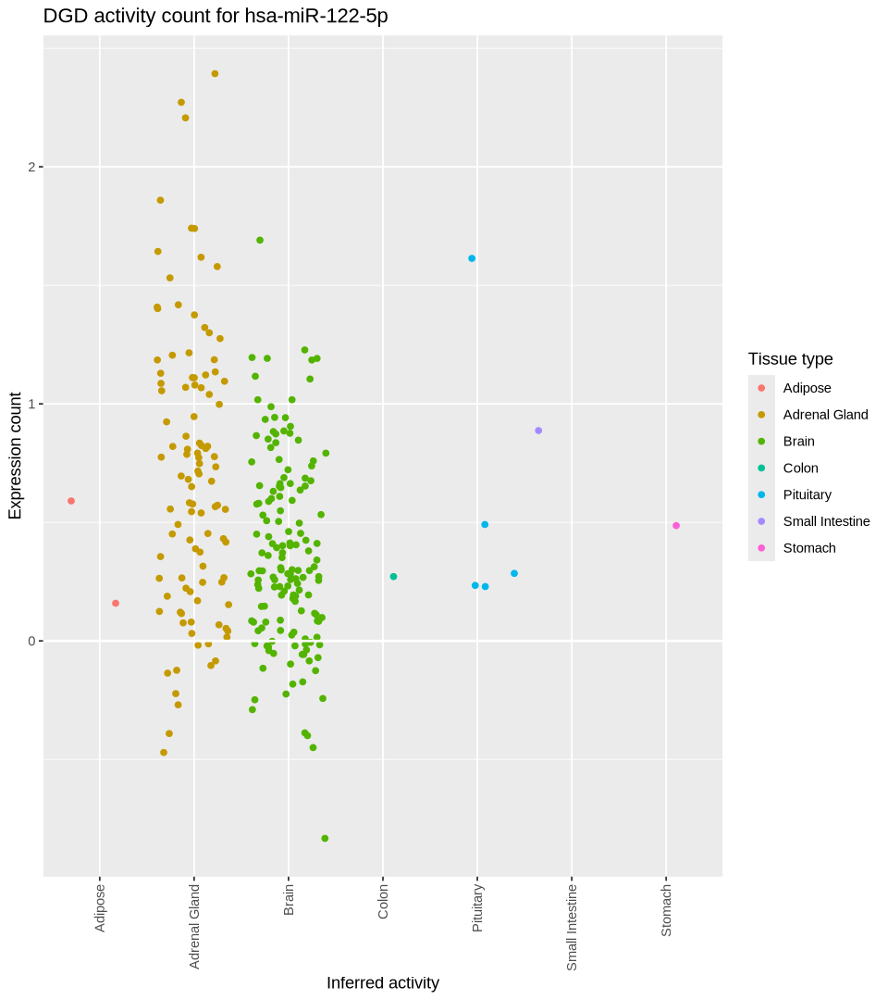

In [33]:
options(repr.plot.width=8, repr.plot.height=9)

name = "hsa-miR-122-5p"

dat_df <- df %>% filter(miRNA == name) %>% filter(primary_site == "Adrenal Gland") %>% arrange(desc(tissue_type))

dat_df %>%
    ggplot(aes(comp_name, DGD_activity)) +
    geom_jitter(aes(color = comp_name)) +
    geom_hline(aes(yintercept = 0), color = "white", linewidth = 0.75) +
    labs(title = paste0("DGD activity count for ", name)) +
    scale_color_discrete(name = "Tissue type") +
    xlab("Inferred activity") +
    ylab("Expression count") +
    #ylim(-5, 10) +
    #stat_summary_bin(fun = mean, geom = "crossbar", aes(group = tissue_type, color = paste0(tissue_type, " Mean"))) +
    # stat_summary(fun.data = ~ round(data.frame(mean = mean(.x)), 0), geom = "text", aes(label = after_stat(mean), group = tissue_type, y = stage(expression, after_stat = mean + 2000))) +
    theme(axis.text.x = element_text(angle = 90, vjust = 0.5, hjust = 1)) +
    NULL

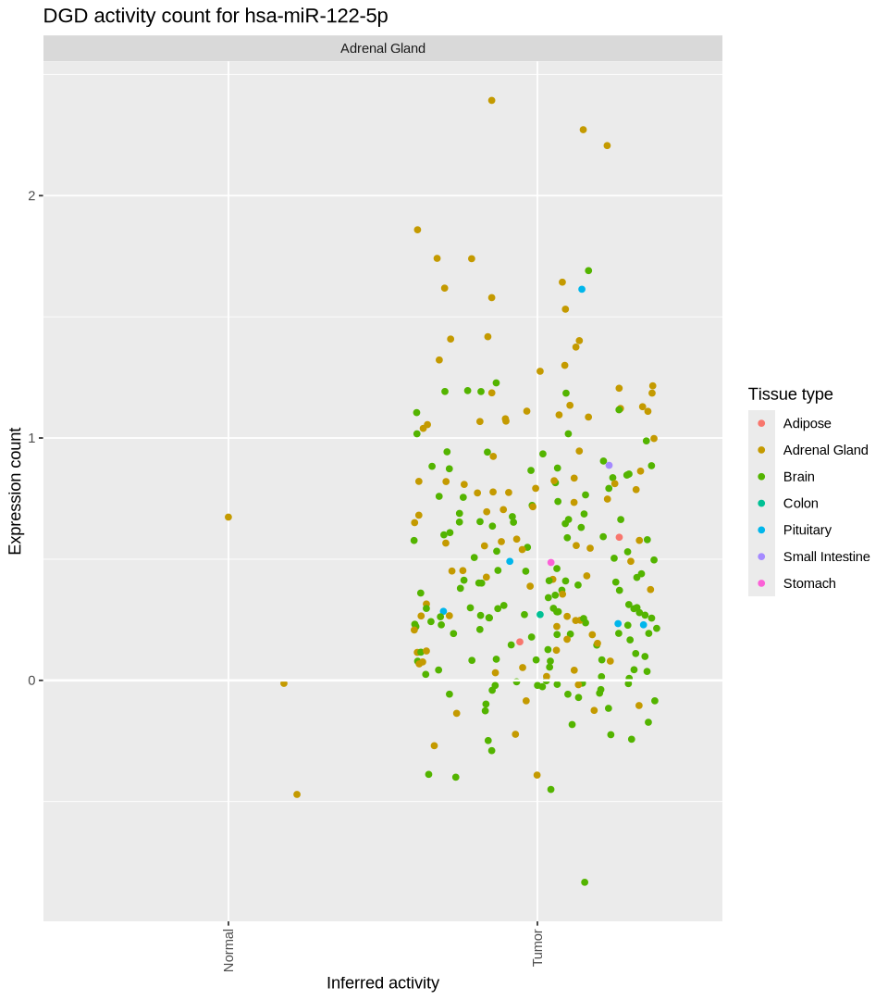

In [34]:
dat_df %>%
    ggplot(aes(tissue_type, DGD_activity)) +
    geom_jitter(aes(color = comp_name)) +
    geom_hline(aes(yintercept = 0), color = "white", linewidth = 0.75) +
    labs(title = paste0("DGD activity count for ", name)) +
    scale_color_discrete(name = "Tissue type") +
    xlab("Inferred activity") +
    ylab("Expression count") +
    #ylim(-5, 10) +
    #stat_summary_bin(fun = mean, geom = "crossbar", aes(group = tissue_type, color = paste0(tissue_type, " Mean"))) +
    # stat_summary(fun.data = ~ round(data.frame(mean = mean(.x)), 0), geom = "text", aes(label = after_stat(mean), group = tissue_type, y = stage(expression, after_stat = mean + 2000))) +
    theme(axis.text.x = element_text(angle = 90, vjust = 0.5, hjust = 1)) +
    facet_wrap("primary_site", scales = "free") + 
    NULL

In [35]:
head(df)

,sample_id,miRNA,expression,cancer_type,sample_submitter_id,cancer_name,primary_site,sample_type,tissue_type,tumor_descriptor,⋯,vital_status,tissue_or_organ_of_origin,color,DGD_activity,GM_activity,max_prob_density_comp,comp_name_ours,comp_name,max_association_percent,max_prob_density
,<chr>,<chr>,<dbl>,<fct>,<chr>,<fct>,<fct>,<fct>,<fct>,<fct>,⋯,<fct>,<fct>,<fct>,<dbl>,<dbl>,<dbl>,<fct>,<fct>,<dbl>,<dbl>
1,TCGA-EW-A6SA-01A-21R-A32P-07,hsa-let-7a-5p,63867.18,BRCA,TCGA-EW-A6SA-01A,Breast Invasive Carcinoma,Breast,Primary Tumor,Tumor,Primary,⋯,Alive,"Breast, NOS",#ED1E91,-1.1463613,-0.82465086,28,Breast,Breast,100.00000,9.844606e-20
2,TCGA-E2-A14W-01A-11R-A12D-07,hsa-let-7a-5p,23471.88,BRCA,TCGA-E2-A14W-01A,Breast Invasive Carcinoma,Breast,Primary Tumor,Tumor,Primary,⋯,Alive,"Breast, NOS",#ED1E91,-1.4388003,-0.99281544,28,Breast,Breast,100.00000,1.050095e-09
3,TCGA-EW-A1PD-01A-11R-A144-07,hsa-let-7a-5p,23744.03,BRCA,TCGA-EW-A1PD-01A,Breast Invasive Carcinoma,Breast,Primary Tumor,Tumor,Primary,⋯,Alive,"Breast, NOS",#ED1E91,-1.1172353,-0.08194884,28,Breast,Breast,100.00000,6.007054e-15
4,TCGA-55-1594-01A-01R-0946-07,hsa-let-7a-5p,10814.66,LUAD,TCGA-55-1594-01A,Lung Adenocarcinoma,Lung,Primary Tumor,Tumor,Primary,⋯,Alive,"Lower lobe, lung",#D2C3DF,-2.2374550,-3.47406174,13,Lung,Cells,93.98350,2.944543e-20
5,TCGA-49-6742-11A-01R-1858-07,hsa-let-7a-5p,63666.80,LUAD,TCGA-49-6742-11A,Lung Adenocarcinoma,Lung,Solid Tissue Normal,Normal,Not Applicable,⋯,Dead,"Upper lobe, lung",#D2C3DF,0.5045059,1.64744323,43,Lung,Lung,99.99504,3.162420e-28
6,TCGA-50-5932-11A-01R-1755-07,hsa-let-7a-5p,81765.71,LUAD,TCGA-50-5932-11A,Lung Adenocarcinoma,Lung,Solid Tissue Normal,Normal,Not Applicable,⋯,Dead,"Upper lobe, lung",#D2C3DF,1.0884410,2.59366978,43,Lung,Lung,99.99994,3.068785e-13


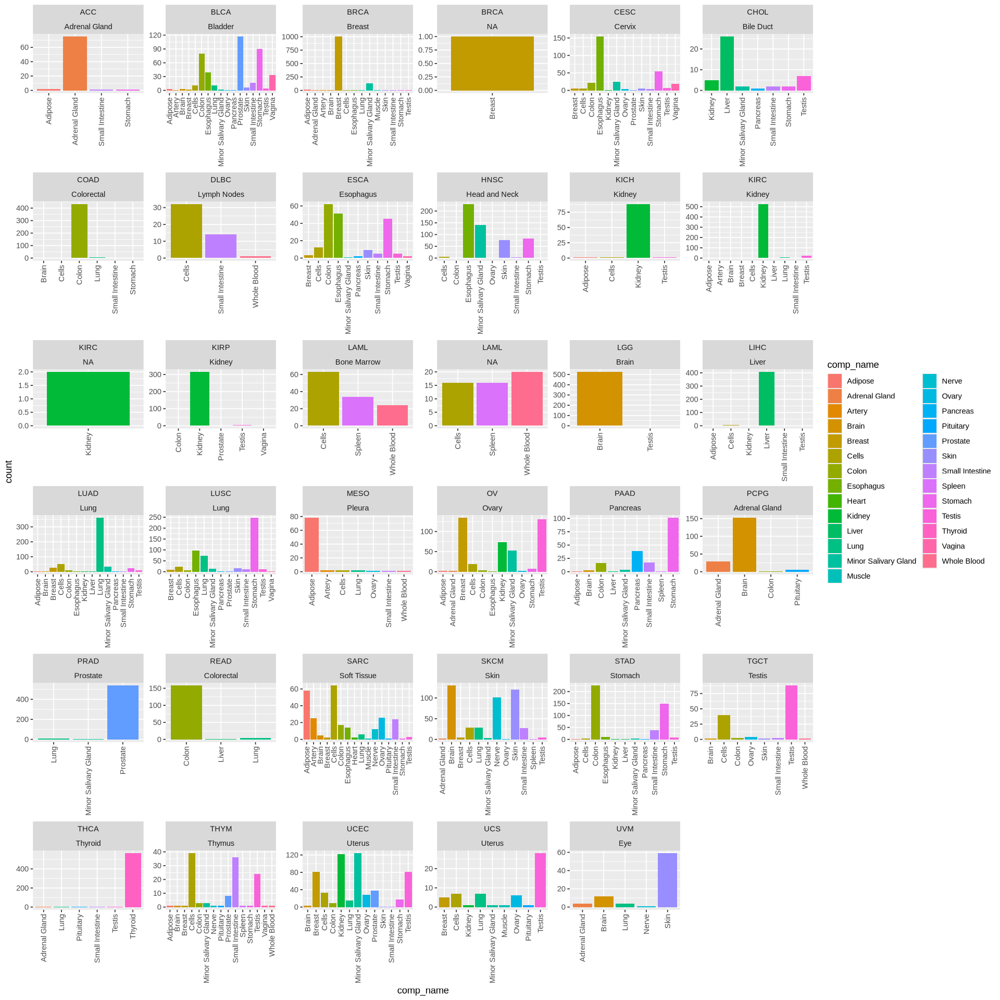

In [36]:
options(repr.plot.width=16, repr.plot.height=16)

component_anno %>%
    #filter(tissue_type == "Normal") %>%
    ggplot(aes(x = comp_name)) +
    geom_bar(aes(fill = comp_name)) +
    #ylim(-5, 10) +
    #stat_summary_bin(fun = mean, geom = "crossbar", aes(group = tissue_type, color = paste0(tissue_type, " Mean"))) +
    # stat_summary(fun.data = ~ round(data.frame(mean = mean(.x)), 0), geom = "text", aes(label = after_stat(mean), group = tissue_type, y = stage(expression, after_stat = mean + 2000))) +
    theme(axis.text.x = element_text(angle = 90, vjust = 0.5, hjust = 1)) + 
    facet_wrap(cancer_type~primary_site, scales = "free") +
    NULL

Scale for colour is already present.
Adding another scale for colour, which will replace the existing scale.
Scale for colour is already present.
Adding another scale for colour, which will replace the existing scale.
Scale for colour is already present.
Adding another scale for colour, which will replace the existing scale.


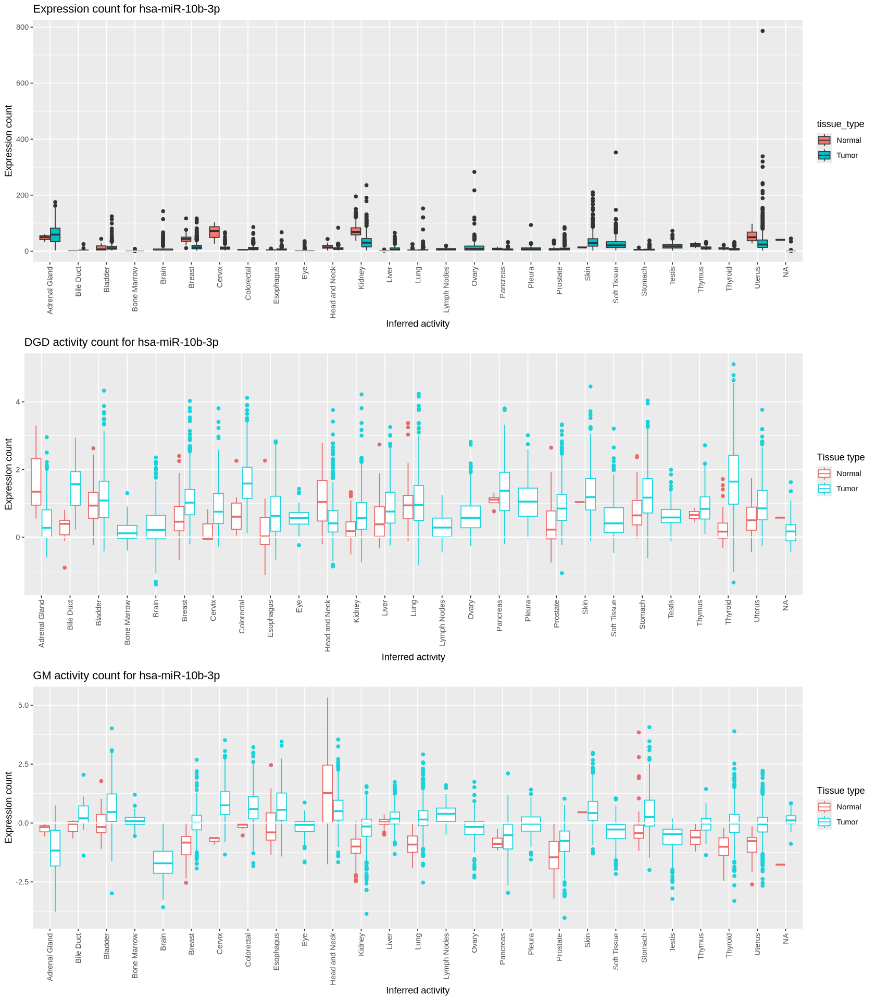

In [37]:
options(repr.plot.width=14, repr.plot.height=16)

name = "hsa-miR-10b-3p"

dat_df <- df %>% filter(miRNA == name) %>% arrange(desc(tissue_type)) 

p1 <- dat_df %>%
    ggplot(aes(primary_site, expression)) +
    geom_boxplot(aes(fill = tissue_type)) +
    geom_hline(aes(yintercept = 0), color = "white", linewidth = 0.75) +
    labs(title = paste0("Expression count for ", name)) +
    scale_color_discrete(name = "Tissue type") +
    xlab("Inferred activity") +
    ylab("Expression count") +
    #ylim(0,1) +
    #stat_summary_bin(fun = mean, geom = "crossbar", aes(group = tissue_type, color = paste0(tissue_type, " Mean"))) +
    # stat_summary(fun.data = ~ round(data.frame(mean = mean(.x)), 0), geom = "text", aes(label = after_stat(mean), group = tissue_type, y = stage(expression, after_stat = mean + 2000))) +
    theme(axis.text.x = element_text(angle = 90, vjust = 0.5, hjust = 1)) +
    scale_color_manual(values = c("#e96969", "#18d3dc", "#d81818", "#071f65"), name = "Tissue type") +
    NULL

p2 <- dat_df %>%
    ggplot(aes(primary_site, DGD_activity)) +
    geom_boxplot(aes(color = tissue_type)) +
    geom_hline(aes(yintercept = 0), color = "white", linewidth = 0.75) +
    labs(title = paste0("DGD activity count for ", name)) +
    scale_color_discrete(name = "Tissue type") +
    xlab("Inferred activity") +
    ylab("Expression count") +
    #ylim(-5, 10) +
    #stat_summary_bin(fun = mean, geom = "crossbar", aes(group = tissue_type, color = paste0(tissue_type, " Mean"))) +
    # stat_summary(fun.data = ~ round(data.frame(mean = mean(.x)), 0), geom = "text", aes(label = after_stat(mean), group = tissue_type, y = stage(expression, after_stat = mean + 2000))) +
    theme(axis.text.x = element_text(angle = 90, vjust = 0.5, hjust = 1)) +
    scale_color_manual(values = c("#e96969", "#18d3dc", "#d81818", "#071f65"), name = "Tissue type") +
    NULL

p3 <- dat_df %>%
    ggplot(aes(primary_site, GM_activity)) +
    geom_boxplot(aes(color = tissue_type)) +
    geom_hline(aes(yintercept = 0), color = "white", linewidth = 0.75) +
    labs(title = paste0("GM activity count for ", name)) +
    scale_color_discrete(name = "Tissue type") +
    xlab("Inferred activity") +
    ylab("Expression count") +
    #ylim(-5, 10) +
    # stat_summary_bin(fun = mean, geom = "crossbar", aes(group = tissue_type, color = paste0(tissue_type, " Mean")), alpha = 0.3) +
    # stat_summary(fun.data = ~ round(data.frame(mean = mean(.x)), 0), geom = "text", aes(label = after_stat(mean), group = tissue_type, y = stage(expression, after_stat = mean + 2000))) +
    theme(axis.text.x = element_text(angle = 90, vjust = 0.5, hjust = 1)) +
    scale_color_manual(values = c("#e96969", "#18d3dc", "#d81818", "#071f65"), name = "Tissue type") +
    NULL

grid.arrange(p1, p2, p3, ncol = 1)

### Comparing groups of miRNAs

In [38]:
# Create a subset to view
names = c("hsa-miR-122-5p", "hsa-miR-124-3p", "hsa-miR-7-5p", "hsa-miR-1-3p", "hsa-miR-9-5p", "hsa-miR-133a-5p", "hsa-miR-133a-3p", "hsa-let-7b-3p")

subset <- ad$var %>%
    slice_max(DGD_mean_activity, n = 12)
    #filter(name %in% names)

view <- ad[,ad$var$name %in% subset$name]


In [39]:
exp <- as.data.frame(view$X) %>% rowid_to_column("ID")
cohort_act <- as.data.frame(view$layers["cohort_activity"]) %>% rowid_to_column("ID")
DGD_act <-  as.data.frame(view$layers["DGD_activity"]) %>% rowid_to_column("ID")

dat <- left_join(exp, view$obs %>% rowid_to_column("ID")) %>% 
    gather("miRNA", "expression", starts_with("hsa")) %>%
    left_join(., gather(cohort_act, "miRNA", "cohort_activity", starts_with("hsa"))) %>%
    left_join(., gather(DGD_act, "miRNA", "DGD_activity", starts_with("hsa"))) %>%
    left_join(., view$var, by = join_by(miRNA == name))

head(dat)

Joining with `by = join_by(ID)`
Joining with `by = join_by(ID, miRNA)`
Joining with `by = join_by(ID, miRNA)`


,ID,sample_id,cancer_type,sample_submitter_id,cancer_name,primary_site,sample_type,tissue_type,tumor_descriptor,age_at_index,⋯,cohort_R_spearman,cohort_pval_spearman,DGD_R_pearson,DGD_pval_pearson,DGD_R_spearman,DGD_pval_spearman,mean_expression,cohort_mean_activity.y,DGD_mean_activity.y,sd_expression
,<int>,<chr>,<fct>,<chr>,<fct>,<fct>,<fct>,<fct>,<fct>,<fct>,⋯,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
1,1,TCGA-EW-A6SA-01A-21R-A32P-07,BRCA,TCGA-EW-A6SA-01A,Breast Invasive Carcinoma,Breast,Primary Tumor,Tumor,Primary,59,⋯,-0.04997593,2.389888e-07,0.006540374,0.4992446,0.04242192,1.162585e-05,0.03791179,-0.2049697,2.275107,0.1965221
2,2,TCGA-E2-A14W-01A-11R-A12D-07,BRCA,TCGA-E2-A14W-01A,Breast Invasive Carcinoma,Breast,Primary Tumor,Tumor,Primary,78,⋯,-0.04997593,2.389888e-07,0.006540374,0.4992446,0.04242192,1.162585e-05,0.03791179,-0.2049697,2.275107,0.1965221
3,3,TCGA-EW-A1PD-01A-11R-A144-07,BRCA,TCGA-EW-A1PD-01A,Breast Invasive Carcinoma,Breast,Primary Tumor,Tumor,Primary,61,⋯,-0.04997593,2.389888e-07,0.006540374,0.4992446,0.04242192,1.162585e-05,0.03791179,-0.2049697,2.275107,0.1965221
4,4,TCGA-55-1594-01A-01R-0946-07,LUAD,TCGA-55-1594-01A,Lung Adenocarcinoma,Lung,Primary Tumor,Tumor,Primary,68,⋯,-0.04997593,2.389888e-07,0.006540374,0.4992446,0.04242192,1.162585e-05,0.03791179,-0.2049697,2.275107,0.1965221
5,5,TCGA-49-6742-11A-01R-1858-07,LUAD,TCGA-49-6742-11A,Lung Adenocarcinoma,Lung,Solid Tissue Normal,Normal,Not Applicable,70,⋯,-0.04997593,2.389888e-07,0.006540374,0.4992446,0.04242192,1.162585e-05,0.03791179,-0.2049697,2.275107,0.1965221
6,6,TCGA-50-5932-11A-01R-1755-07,LUAD,TCGA-50-5932-11A,Lung Adenocarcinoma,Lung,Solid Tissue Normal,Normal,Not Applicable,75,⋯,-0.04997593,2.389888e-07,0.006540374,0.4992446,0.04242192,1.162585e-05,0.03791179,-0.2049697,2.275107,0.1965221


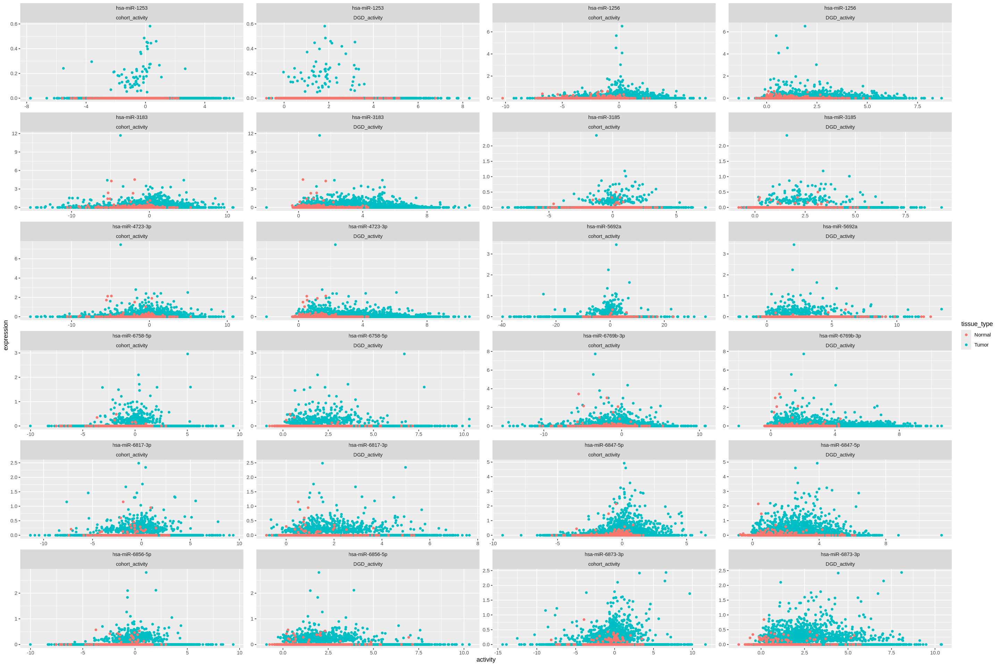

In [40]:
options(repr.plot.width=24, repr.plot.height=16)

dat %>%
    gather("method", "activity", c(DGD_activity, cohort_activity)) %>%
    arrange(desc(tissue_type)) %>%
    ggplot(aes(y = expression, x = activity, color = tissue_type)) +
    geom_point() + 
    facet_wrap(miRNA~method, scales = "free", ncol = 4)

Warning message:
“Using alpha for a discrete variable is not advised.”


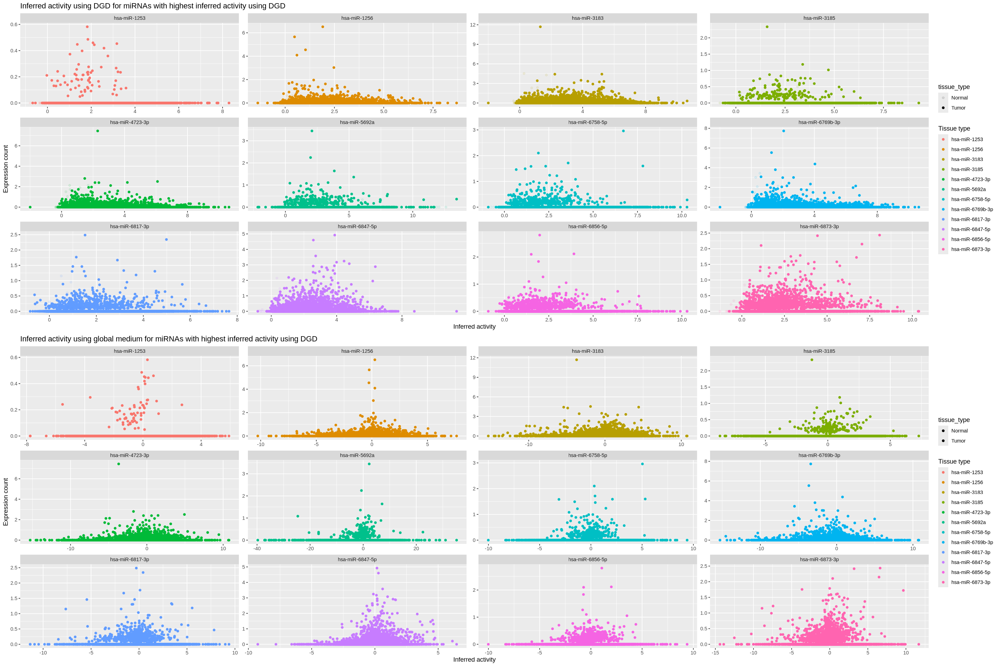

In [41]:
options(repr.plot.width=24, repr.plot.height=16)

p1 <- dat %>%
    ggplot(aes(y = expression, x = DGD_activity, alpha = tissue_type, color = miRNA)) +
    geom_point() + 
    facet_wrap("miRNA", scales = "free") + 
    labs(title = paste0("Inferred activity using DGD for miRNAs with highest inferred activity using DGD") ) + 
    scale_color_discrete(name = "Tissue type") + 
    xlab("Inferred activity") + 
    ylab("Expression count") +
    NULL

p2 <- dat %>%
    ggplot(aes(y = expression, x = cohort_activity, fill = tissue_type, color = miRNA)) +
    geom_point() + 
    facet_wrap("miRNA", scales = "free") + 
    labs(title = paste0("Inferred activity using global medium for miRNAs with highest inferred activity using DGD") ) + 
    scale_color_discrete(name = "Tissue type") + 
    xlab("Inferred activity") + 
    ylab("Expression count") +
    NULL

grid.arrange(p1, p2)

[1] Primary        Recurrence     New Primary    Not Applicable
Levels: Metastatic New Primary Not Applicable Primary Recurrence

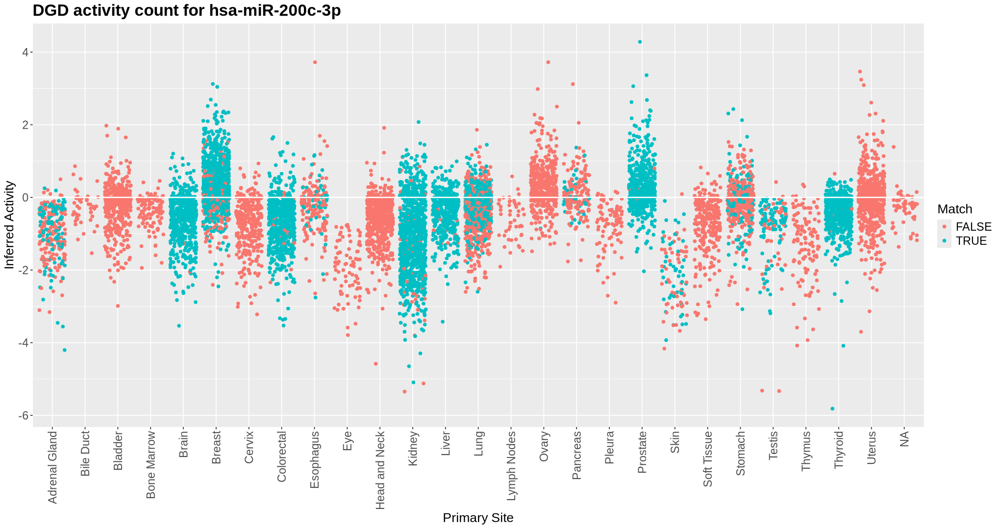

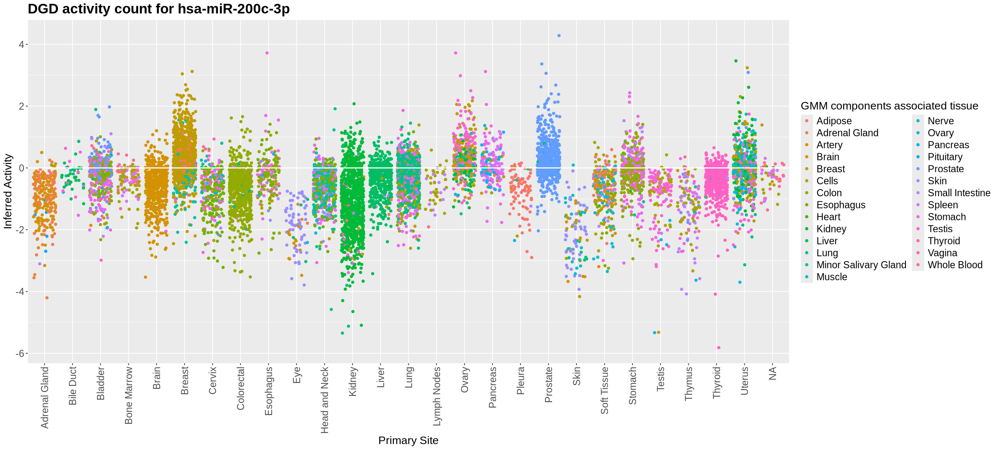

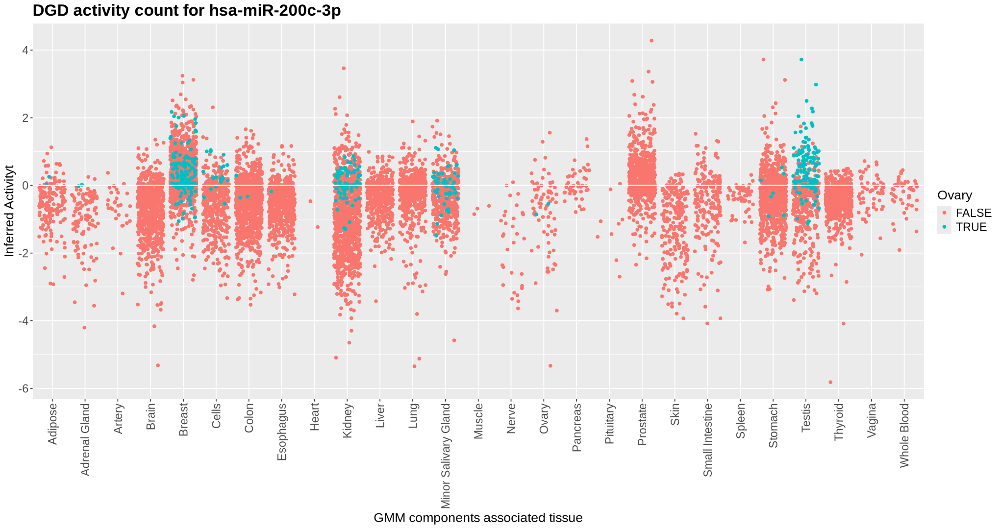

In [43]:
options(repr.plot.width=16, repr.plot.height=9)

name = "hsa-miR-200c-3p"

dat_df <- df %>% filter(miRNA == name) %>% arrange(desc(tissue_type))

match_names <- function(name1, name2) {
  if (is.na(name1) || is.na(name2)) {
    return(FALSE)
  }
  (name1 == name2) || (name1 == "Colorectal" && name2 == "Colon")
}
dat_df <- dat_df %>%
  mutate(match_status = mapply(match_names, as.character(primary_site), as.character(comp_name))) %>% filter(tumor_descriptor != "Metastatic")

unique(dat_df$tumor_descriptor)
tissue_match <- function(name1) {
  if (is.na(name1)) {
    return(FALSE)
  }
  (name1 == "Ovary")
}
dat_df <- dat_df %>%
  mutate(tissue_match = mapply(tissue_match, as.character(primary_site)))
options(repr.plot.width=17, repr.plot.height=9)

dat_df %>%
    ggplot(aes(primary_site, DGD_activity)) +
    geom_jitter(aes(color = match_status)) +
    geom_hline(aes(yintercept = 0), color = "white", linewidth = 0.75) +
    labs(title = paste0("DGD activity count for ", name)) +
    scale_color_discrete(name = "Match") +
    xlab("Primary Site") +
    ylab("Inferred Activity") +
    theme_gray()+
        theme(
          legend.text = element_text(size = 14),       
          legend.title = element_text(size = 16),       
          axis.text = element_text(size = 14),       
          axis.title = element_text(size = 16),
          plot.title = element_text(size = 20, face = "bold"),
          axis.text.x = element_text(angle = 90, vjust = 0.5, hjust = 1)   
        ) + 
    NULL

options(repr.plot.width=20, repr.plot.height=9)

dat_df %>%
    ggplot(aes(primary_site, DGD_activity)) +
    geom_jitter(aes(color = comp_name)) +
    geom_hline(aes(yintercept = 0), color = "white", linewidth = 0.75) +
    labs(title = paste0("DGD activity count for ", name)) +
    scale_color_discrete(name = "GMM components associated tissue") +
    xlab("Primary Site") +
    ylab("Inferred Activity") +
        theme(
          legend.text = element_text(size = 14),       
          legend.title = element_text(size = 16),       
          axis.text = element_text(size = 14),       
          axis.title = element_text(size = 16),
          plot.title = element_text(size = 20, face = "bold"),
          axis.text.x = element_text(angle = 90, vjust = 0.5, hjust = 1)   
        ) + 
    NULL


options(repr.plot.width=17, repr.plot.height=9)
dat_df2 <- dat_df %>% arrange(tissue_match)

  dat_df2 %>%
    ggplot(aes(comp_name, DGD_activity)) +
    geom_jitter(aes(color = tissue_match)) +
    geom_hline(aes(yintercept = 0), color = "white", linewidth = 0.75) +
    labs(title = paste0("DGD activity count for ", name)) +
    scale_color_discrete(name = "Ovary") +
    xlab("GMM components associated tissue") +
    ylab("Inferred Activityt") +
        theme(
          legend.text = element_text(size = 14),       
          legend.title = element_text(size = 16),       
          axis.text = element_text(size = 14),       
          axis.title = element_text(size = 16),
          plot.title = element_text(size = 20, face = "bold"),
          axis.text.x = element_text(angle = 90, vjust = 0.5, hjust = 1)   
        ) + 
    NULL